In [2]:
import pandas as pd
import xarray as xr
import numpy as np
import netCDF4
# import nc_time_axis
import matplotlib.pyplot as plt
import glob
import cmocean
import xskillscore as xs
import datetime
# from sklearn.metrics import mean_squared_error

import h5py
from scipy.io import loadmat
from scipy import signal
from scipy.interpolate import griddata
import cartopy.crs as ccrs

In [3]:
## Working directory
wrk_dir = '~/work/OBS/dashcams_data/plotting_for_draft_supplementary/'

In [4]:
# load satellite data (2007-2021)

for iy in range(2020,2025):
    print(iy)
    with h5py.File(f'/home/server/pi/homes/liux8/work/OBS/xliu_obs_process/model_satellite/sst_data/sst_{iy}_MUR.mat', 'r') as file:
        def print_attrs(name, obj):
            print(name)
            for key, val in obj.attrs.items():
                print(f"    {key}: {val}")
        
        sst0 = file['sst'][:]
        if iy < 2023:
            sst0=sst0-273.15
        
        # sst_mean = np.nanmean(np.nanmean(sst,axis=1),axis=1)
        if iy==2020:
            sst = sst0
        else:
            sst = np.concatenate((sst,sst0),axis=0)
            
            # sst_mean0 = np.concatenate((sst_mean0,sst_mean),axis=0)
            
        file.visititems(print_attrs)


2020
ilon1
    MATLAB_class: b'double'
jlat1
    MATLAB_class: b'double'
sst
    MATLAB_class: b'double'
2021
ilon1
    MATLAB_class: b'double'
jlat1
    MATLAB_class: b'double'
sst
    MATLAB_class: b'double'
2022
ilon1
    MATLAB_class: b'double'
jlat1
    MATLAB_class: b'double'
sst
    MATLAB_class: b'double'
2023
ilon1
    MATLAB_class: b'double'
jlat1
    MATLAB_class: b'double'
sst
    MATLAB_class: b'double'
2024
ilon1
    MATLAB_class: b'double'
jlat1
    MATLAB_class: b'double'
sst
    MATLAB_class: b'double'


In [5]:
lon0 = loadmat('/home/server/pi/homes/liux8/work/OBS/xliu_obs_process/sst_lonlat_MUR.mat')['lon']
lat0 = loadmat('/home/server/pi/homes/liux8/work/OBS/xliu_obs_process/sst_lonlat_MUR.mat')['lat']

ilon = loadmat('/home/server/pi/homes/liux8/work/OBS/xliu_obs_process/sst_ilon_ilat_MUR.mat')['ilon1']
jlat = loadmat('/home/server/pi/homes/liux8/work/OBS/xliu_obs_process/sst_ilon_ilat_MUR.mat')['jlat1']

lon_mur = lon0[ilon[0,0].astype(int)-1:ilon[-1,0].astype(int)]
lat_mur = lat0[jlat[0,0].astype(int)-1:jlat[-1,0].astype(int)]

In [6]:
tdim = sst.shape[0]
print(tdim)
da_mur = xr.DataArray(sst, coords={'time': np.arange(0,tdim*86400,86400)+50*365*86400+12*86400,'lon': lon_mur[:,0] ,'lat': lat_mur[:,0]},
                  dims=['time','lat','lon'])

# da2_mur = da_mur.interp(lon=datasets_era[0].lonc,lat=datasets_era[0].latc,method='linear')

ds_mur = xr.Dataset({'sst': da_mur})
ds_mur['time'] = pd.to_datetime(ds_mur['time'].values,unit='s')
# ds_dust['time'] = pd.to_datetime(ds_dust['time'].values,unit='s')

1735


# load raw data

## can use NC file below directly

In [3]:
file1=wrk_dir+'PG_dive_raw_v1_longrec_keepGPS_BAHHASO23.csv'; ptime=165
# file1='surf_processed/Jul_Sep_2021.csv'; ptime=220
# file1='surf_processed/Oct_Dec_2021.csv'

# yr=file1[-21:-17]
# yr=file1[-13:-9]
df = pd.read_csv(file1,parse_dates=True,index_col='UTC_datetime')

/tmp/ipykernel_3996697/4255902347.py:7: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file1,parse_dates=True,index_col='UTC_datetime')


In [4]:
df[(pd.to_datetime(df['date'])>=pd.to_datetime('2024-5-15 3:36'))&(pd.to_datetime(df['date'])<=pd.to_datetime('2024-5-15 9:42'))]

,device_id,UTC_date,UTC_time,datatype,satcount,Latitude,Longitude,UTC_timestamp,milliseconds,depth_m,ext_temperature_C,date
UTC_datetime,,,,,,,,,,,,
2024-05-15 03:57:29,237244,2024-05-15,03:57:29,GPS,9.0,27.398371,49.313900,2024-05-15 03:57:29.542,542,NaN,NaN,2024-05-15 03:57:29
2024-05-15 04:27:43,237244,2024-05-15,04:27:43,GPS,11.0,27.422407,49.301296,2024-05-15 04:27:43.000,0,NaN,NaN,2024-05-15 04:27:43
2024-05-15 04:57:53,237244,2024-05-15,04:57:53,GPS,9.0,27.422485,49.301346,2024-05-15 04:57:53.000,0,NaN,NaN,2024-05-15 04:57:53
2024-05-15 05:27:43,237244,2024-05-15,05:27:43,GPS,13.0,27.422592,49.301426,2024-05-15 05:27:43.000,0,NaN,NaN,2024-05-15 05:27:43
2024-05-15 05:58:49,237244,2024-05-15,05:58:49,GPS,0.0,0.000000,0.000000,2024-05-15 05:58:49.000,0,NaN,NaN,2024-05-15 05:58:49
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-15 09:41:56,237261,2024-05-15,09:41:56,SEND_ALL2_1Hz,NaN,NaN,NaN,2024-05-15 09:41:56.000,0,1.38,29.515625,2024-05-15 09:41:56
2024-05-15 09:41:57,237261,2024-05-15,09:41:57,SEND_ALL2_1Hz,NaN,NaN,NaN,2024-05-15 09:41:57.000,0,1.44,29.507812,2024-05-15 09:41:57
2024-05-15 09:41:58,237261,2024-05-15,09:41:58,SEND_ALL2_1Hz,NaN,NaN,NaN,2024-05-15 09:41:58.000,0,1.44,29.515625,2024-05-15 09:41:58


In [7]:
df['t'] = pd.to_datetime(df['date']) + pd.to_timedelta(df['milliseconds'], unit='ms')

In [8]:
df['date2'] = df['t']
df = df.set_index('t')
df

,device_id,UTC_date,UTC_time,datatype,satcount,Latitude,Longitude,UTC_timestamp,milliseconds,depth_m,ext_temperature_C,date,date2
t,,,,,,,,,,,,,
2023-11-03 07:11:53.000,237244,2023-11-03,07:11:53,GPS,5.0,25.751921,50.786697,2023-11-03 07:11:53.000,0,NaN,NaN,2023-11-03 07:11:53,2023-11-03 07:11:53.000
2023-11-03 07:39:05.000,237244,2023-11-03,07:39:05,GPS,8.0,25.757145,50.784084,2023-11-03 07:39:05.000,0,NaN,NaN,2023-11-03 07:39:05,2023-11-03 07:39:05.000
2023-11-03 08:08:42.290,237244,2023-11-03,08:08:42,GPS,8.0,25.757200,50.784069,2023-11-03 08:08:42.290,290,NaN,NaN,2023-11-03 08:08:42,2023-11-03 08:08:42.290
2023-11-03 08:38:41.307,237244,2023-11-03,08:38:41,GPS,8.0,25.757296,50.784126,2023-11-03 08:38:41.307,307,NaN,NaN,2023-11-03 08:38:41,2023-11-03 08:38:41.307
2023-11-03 09:08:47.381,237244,2023-11-03,09:08:47,GPS,5.0,25.757057,50.784569,2023-11-03 09:08:47.381,381,NaN,NaN,2023-11-03 09:08:47,2023-11-03 09:08:47.381
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-26 04:44:41.000,237263,2024-04-26,04:44:41,GPS,0,0.000000,0.000000,2024-04-26 04:44:41.000,0,NaN,NaN,2024-04-26 04:44:41,2024-04-26 04:44:41.000
2024-04-26 19:15:00.000,237263,2024-04-26,19:15:00,GPS,0,0.000000,0.000000,2024-04-26 19:15:00.000,0,NaN,NaN,2024-04-26 19:15:00,2024-04-26 19:15:00.000
2024-04-26 21:15:00.000,237263,2024-04-26,21:15:00,GPSS,0,0.000000,0.000000,2024-04-26 21:15:00.000,0,NaN,NaN,2024-04-26 21:15:00,2024-04-26 21:15:00.000


In [9]:
df[(df['date2']>=pd.to_datetime('2024-5-23 1:21'))&(df['date2']<=pd.to_datetime('2024-5-23 6:50'))]

,device_id,UTC_date,UTC_time,datatype,satcount,Latitude,Longitude,UTC_timestamp,milliseconds,depth_m,ext_temperature_C,date,date2
t,,,,,,,,,,,,,
2024-05-23 01:22:16.142,237244,2024-05-23,01:22:16,GPS,7.0,28.181320,48.647095,2024-05-23 01:22:16.142,142,NaN,NaN,2024-05-23 01:22:16,2024-05-23 01:22:16.142
2024-05-23 01:52:14.139,237244,2024-05-23,01:52:14,GPS,8.0,28.181309,48.647182,2024-05-23 01:52:14.139,139,NaN,NaN,2024-05-23 01:52:14,2024-05-23 01:52:14.139
2024-05-23 02:22:14.115,237244,2024-05-23,02:22:14,GPS,6.0,28.181368,48.647263,2024-05-23 02:22:14.115,115,NaN,NaN,2024-05-23 02:22:14,2024-05-23 02:22:14.115
2024-05-23 02:52:17.128,237244,2024-05-23,02:52:17,GPS,7.0,28.180109,48.649544,2024-05-23 02:52:17.128,128,NaN,NaN,2024-05-23 02:52:17,2024-05-23 02:52:17.128
2024-05-23 03:22:17.134,237244,2024-05-23,03:22:17,GPS,5.0,28.165495,48.690716,2024-05-23 03:22:17.134,134,NaN,NaN,2024-05-23 03:22:17,2024-05-23 03:22:17.134
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-23 04:24:05.000,237261,2024-05-23,04:24:05,GPS,9.0,26.193813,50.607162,2024-05-23 04:24:05.000,0,NaN,NaN,2024-05-23 04:24:05,2024-05-23 04:24:05.000
2024-05-23 04:53:41.975,237261,2024-05-23,04:53:41,GPS,8.0,26.193798,50.607140,2024-05-23 04:53:41.975,975,NaN,NaN,2024-05-23 04:53:41,2024-05-23 04:53:41.975
2024-05-23 05:23:43.978,237261,2024-05-23,05:23:43,GPS,7.0,26.193743,50.607178,2024-05-23 05:23:43.978,978,NaN,NaN,2024-05-23 05:23:43,2024-05-23 05:23:43.978


In [33]:
# df1 = df.loc[df['device_id']==203013]

# x = xr.DataArray(df.Longitude_1, dims="t")
# y = xr.DataArray(df.Latitude_1, dims="t")
time = xr.DataArray(df.date2, dims="t")
did = xr.DataArray(df.device_id, dims="t")
# accx = xr.DataArray(df.acc_x,dims='t')
# accy = xr.DataArray(df.acc_y,dims='t')
# accz = xr.DataArray(df.acc_z,dims='t')
lon = xr.DataArray(df.Longitude,dims='t')
lat = xr.DataArray(df.Latitude,dims='t')
datatype = xr.DataArray(df.datatype,dims='t')
depth = xr.DataArray(df.depth_m,dims='t')
temp = xr.DataArray(df.ext_temperature_C, dims="t")
# conduc = xr.DataArray(df['conductivity_mS/cm'], dims="t")

ds_obs = xr.Dataset({
    # 'x': x,
    # 'y': y,
    'time': time,
    'id': did,
    # 'accx': accx,
    # 'accy': accy,
    # 'accz': accz,
    'lon': lon,
    'lat': lat,
    'datatype': datatype,
    'depth': depth,
    'temp': temp,
    # 'cond': conduc
})

In [34]:
ds_obs.to_netcdf('PG_acc_raw_v1_keep_gps_BAHHASO23.nc')

# load NC files

In [7]:
ds_obs = xr.open_dataset(wrk_dir+'PG_acc_raw_v1_keep_gps_BAHHASO23.nc',mode='r')
ds_obs

<xarray.Dataset>
Dimensions:   (t: 16614684)
Coordinates:
  * t         (t) datetime64[ns] 2023-11-03T07:11:53 ... 2024-04-27T01:20:03
Data variables:
    time      (t) datetime64[ns] ...
    id        (t) int64 ...
    lon       (t) float64 ...
    lat       (t) float64 ...
    datatype  (t) object ...
    depth     (t) float64 ...
    temp      (t) float64 ...

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


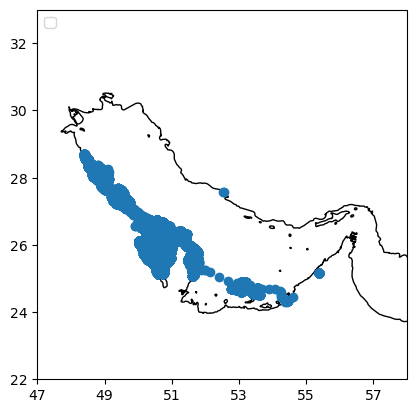

In [8]:
### OLD version
ax = plt.axes(projection=ccrs.PlateCarree())
plt.plot(ds_obs.lon,ds_obs.lat,'o')

ax.coastlines()
ax.set_xlim(47,58)
ax.set_ylim(22,33)
ax.set_xticks(np.arange(47,58,2), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(22,33,2), crs=ccrs.PlateCarree())
ax.legend(loc = "upper left")

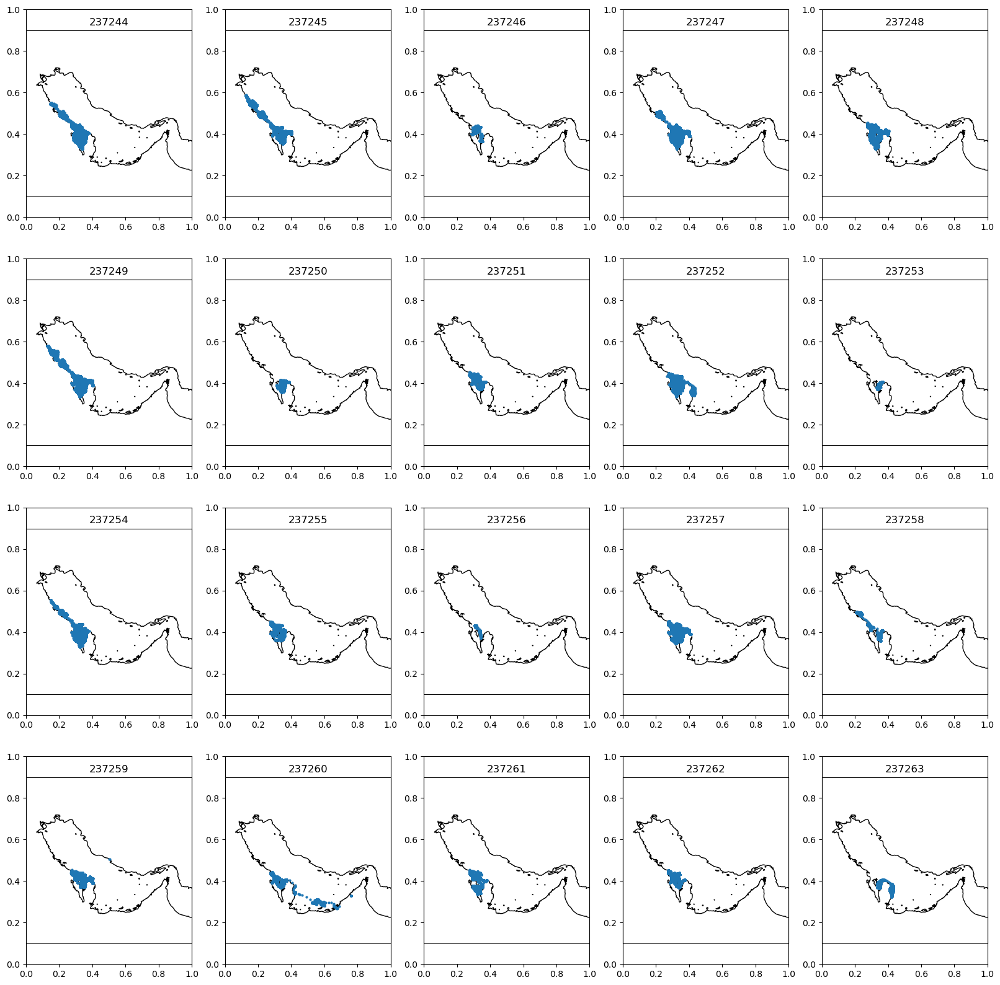

In [72]:
fig,axs = plt.subplots(4,5,figsize=(20,20))
iplt = 0
for i in np.unique(ds_obs.id):
    ax = plt.subplot(4, 5, iplt + 1, projection=ccrs.PlateCarree())
    # ax = plt.axes(projection=ccrs.PlateCarree())
    plt.plot(ds_obs.lon.where(ds_obs.id==i),ds_obs.lat,'o',markersize=2)
    # plt.plot([x_geobox[0],x_geobox[0],x_geobox[1],x_geobox[1],x_geobox[0]],[y_geobox[1],y_geobox[0],y_geobox[0],y_geobox[1],y_geobox[1]])

    ax.coastlines()
    ax.set_xlim(47,58)
    ax.set_ylim(22,33)
    ax.set_title(i)
    iplt += 1
    # ax.set_xlim(x_geobox[0]-0.1,x_geobox[1]+0.1)
    # ax.set_ylim(y_geobox[0]-0.1,y_geobox[1]+0.1)

In [67]:
print( 'tags in the Persian Gulf:' , np.unique(ds_obs.id),len(np.unique(ds_obs.id)))

tags in the Persian Gulf: [237244 237245 237246 237247 237248 237249 237250 237251 237252 237253
 237254 237255 237256 237257 237258 237259 237260 237261 237262 237263] 20


237244
<xarray.DataArray 'time' (t: 632765)>
array(['2023-11-03T07:11:53.000000000', '2023-11-03T07:39:05.000000000',
       '2023-11-03T08:08:42.290000000', ...,
       '2025-03-10T04:06:39.000000000', '2025-03-10T04:36:34.453000000',
       '2025-03-10T05:06:44.000000000'], dtype='datetime64[ns]')
Coordinates:
  * t        (t) datetime64[ns] 2023-11-03T07:11:53 ... 2025-03-10T05:06:44
237245
<xarray.DataArray 'time' (t: 1551514)>
array(['2023-11-03T06:30:35.000000000', '2023-11-03T06:58:07.000000000',
       '2023-11-03T07:27:59.840000000', ...,
       '2025-03-09T22:04:31.000000000', '2025-03-10T00:04:35.000000000',
       '2025-03-10T01:37:43.000000000'], dtype='datetime64[ns]')
Coordinates:
  * t        (t) datetime64[ns] 2023-11-03T06:30:35 ... 2025-03-10T01:37:43
237246
<xarray.DataArray 'time' (t: 135519)>
array(['2023-11-03T06:15:43.000000000', '2023-11-03T06:41:35.843000000',
       '2023-11-03T07:11:36.861000000', ...,
       '2024-01-14T09:07:49.000000000', '2024-01-14T09:3

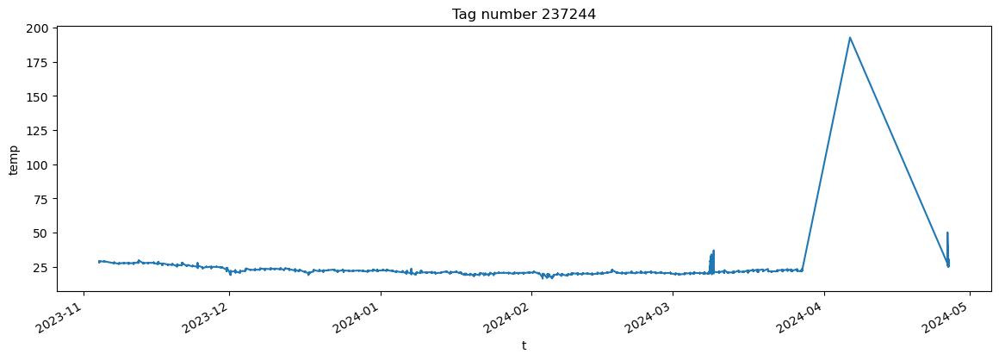

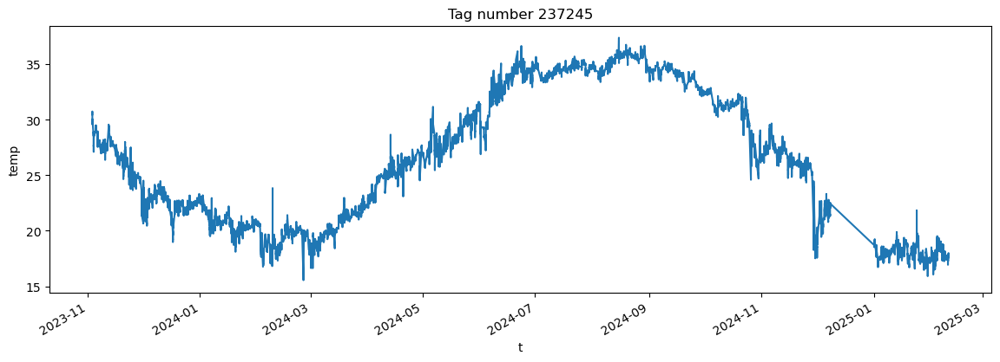

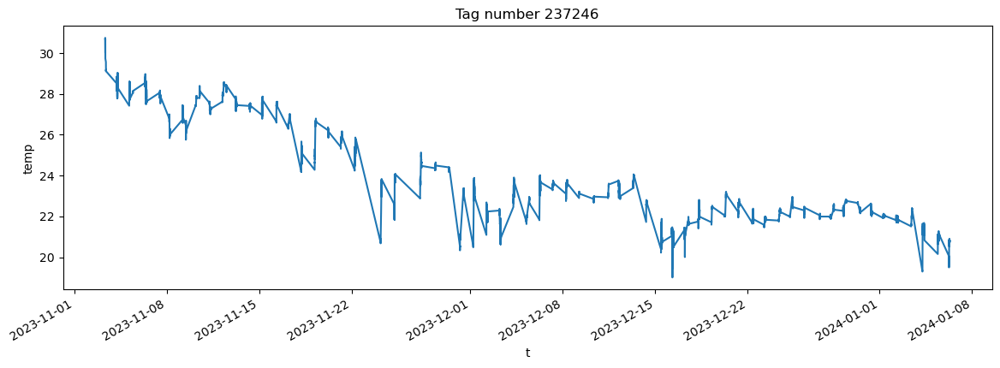

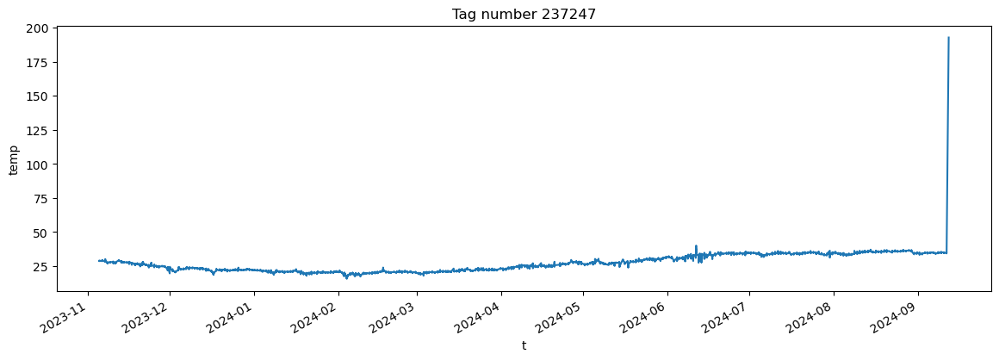

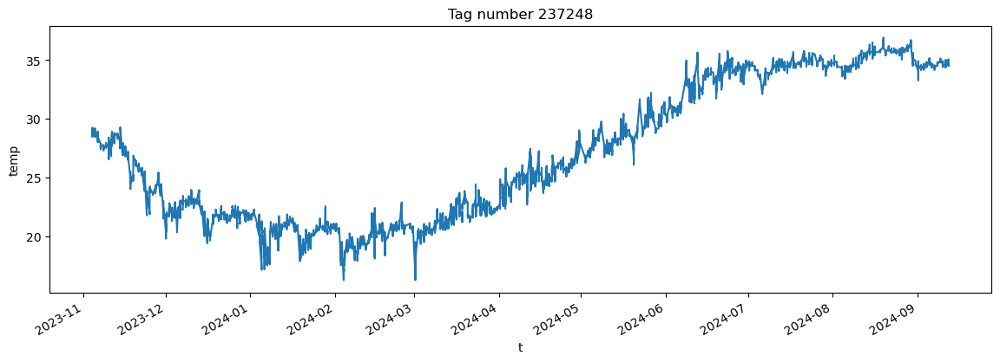

...

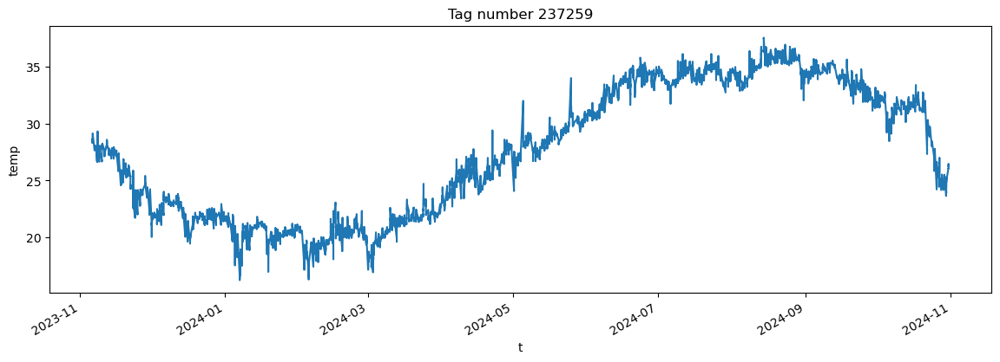

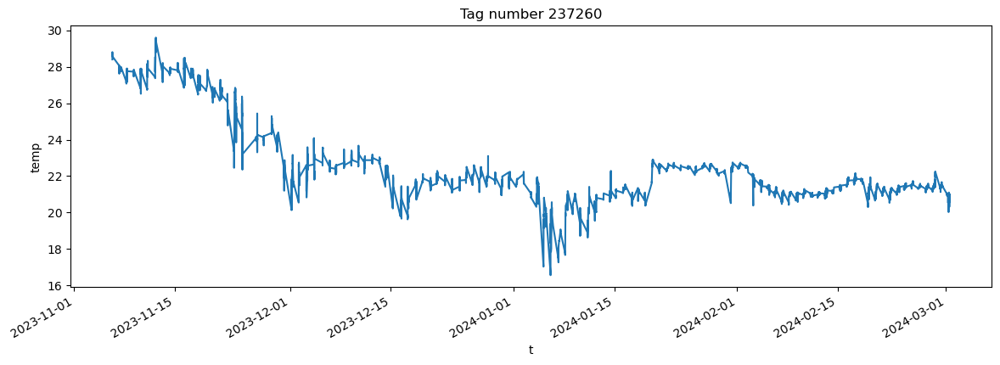

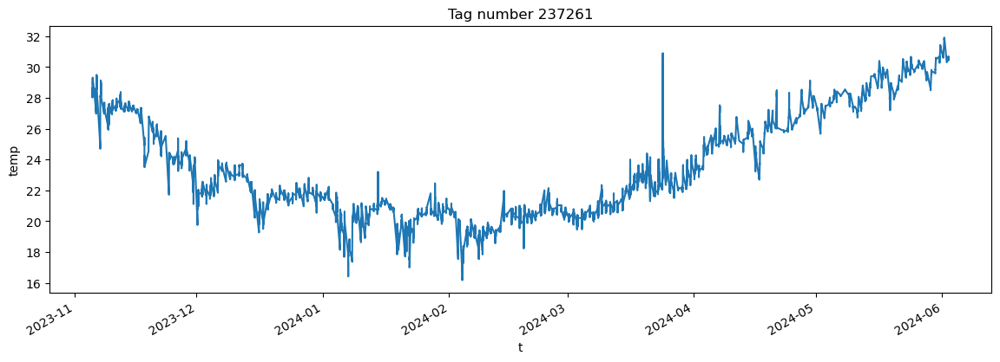

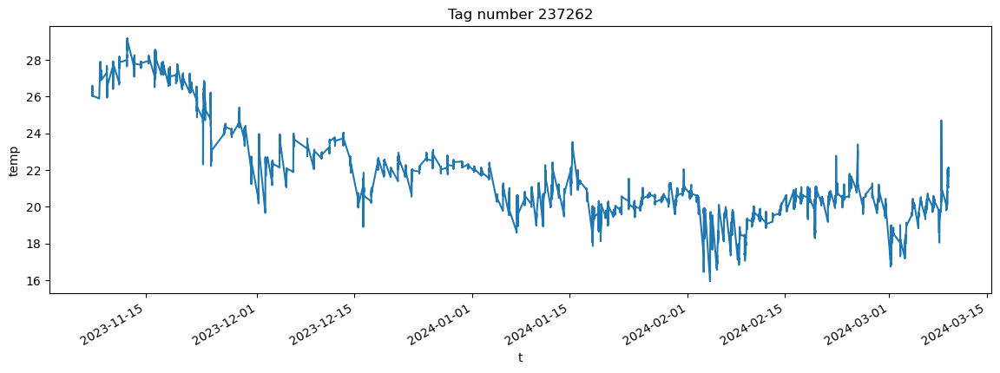

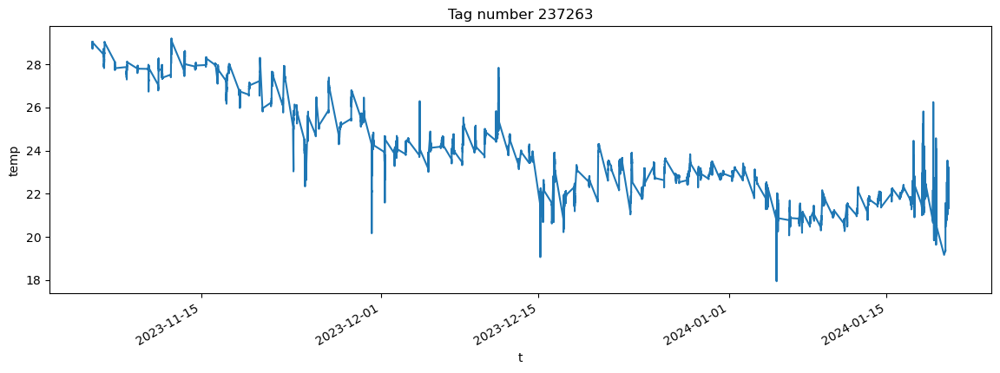

In [115]:
for i in np.unique(ds_obs.id):
    print(i)
    ds_obs_1 = ds_obs.where((ds_obs.id == i),drop=True)
    print(ds_obs_1.time)
    plt.figure(figsize=(14,4))
    ds_obs_1.where(ds_obs_1.datatype=='SEND_ALL2_1Hz',drop=True).temp.plot()
    plt.title(f'Tag number {i}')

    # break

# calculate the total number of SEND_ALL2_1HZ, data for all tags

## Take TAG 237244 as an example

237244
(33, 47, 14)
(48, 96, 48)
(97, 132, 35)
(133, 151, 18)
(152, 182, 30)
(183, 207, 24)
(218, 245, 27)
(246, 280, 34)
(281, 325, 44)
(326, 360, 34)
(360, 396, 36)
(397, 432, 35)
(433, 470, 37)
(471, 507, 36)
(509, 553, 44)
(554, 585, 31)
(585, 664, 79)
(665, 694, 29)
(695, 723, 28)
(724, 765, 41)
(766, 808, 42)
(809, 851, 42)
(852, 896, 44)
(897, 935, 38)
(936, 974, 38)
(975, 1006, 31)
(1007, 1076, 69)
(1077, 1120, 43)
(1121, 1193, 72)
(1194, 1249, 55)
(1250, 1317, 67)
(1318, 1353, 35)
(1354, 1387, 33)
(1388, 1414, 26)
(1415, 1459, 44)
(1460, 1491, 31)
(1492, 1536, 44)
(1537, 1568, 31)
(1569, 1605, 36)
(1606, 1642, 36)
(1644, 1682, 38)
(1683, 1722, 39)
(1723, 1759, 36)
(1760, 1793, 33)
(1794, 1830, 36)
(1831, 1875, 44)
(1876, 1917, 41)
(1918, 1952, 34)
(1953, 1984, 31)
(1985, 2018, 33)
(2019, 2066, 47)
(2067, 2092, 25)
(2093, 2132, 39)
(2133, 2169, 36)
(2170, 2211, 41)
(2212, 2251, 39)
(2252, 2286, 34)
(2287, 2326, 39)
(2327, 2370, 43)
(2371, 2407, 36)
(2407, 2482, 75)
(2483, 2524,

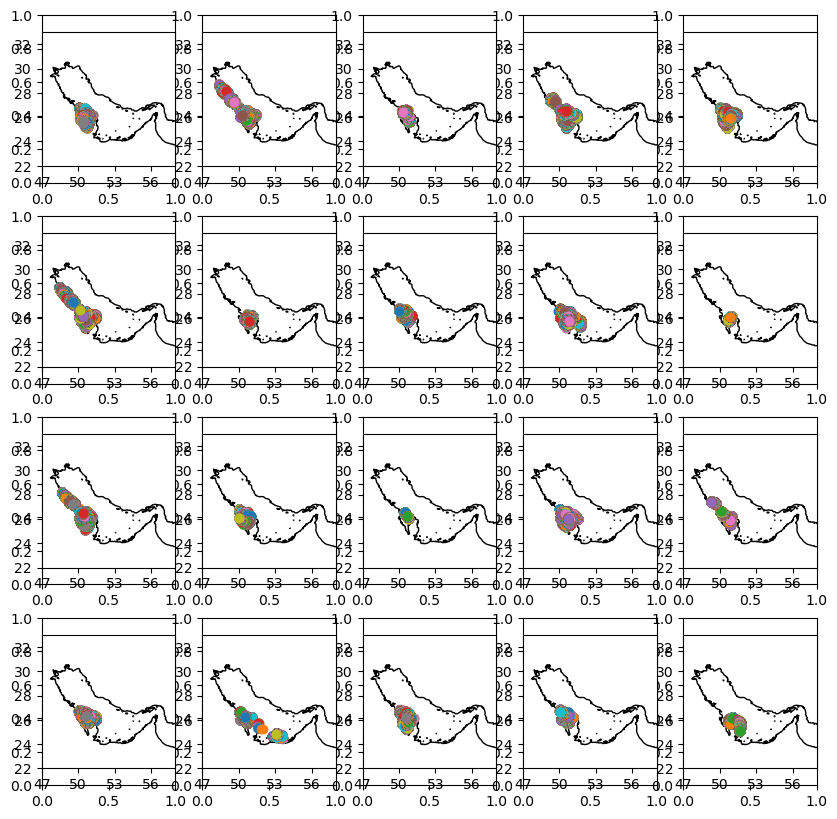

In [93]:
# pick a tag with its id number 191989
# ds_obs_1 is the dataset for the tag 191989

# pd_dive_2 = pd.DataFrame(columns=['ik', 'temp0', 'temp1', 'rec_len','first_record','last_record'])
ds_dive_2 = xr.Dataset(
    {
        'tag_id': ('dive_index', np.array([])),
        'temp1': ('dive_index', np.array([])),
        'temp0': ('dive_index', np.array([])),
        'rec_len': ('dive_index', np.array([])),
        'first_record': ('dive_index', np.array([])),
        'last_record': ('dive_index', np.array([]))
    },
    coords={'dive_index': np.array([])}
)

fig,axs = plt.subplots(4,5,figsize=(10,10))
iplt = 0
for idn in np.unique(ds_obs.id):
    print(idn)
    # create ds_obs_1 for one tag
    ds_obs_1 = ds_obs.where((ds_obs.id == idn),drop=True)
    # Create a new integer coordinate
    new_t = np.arange(len(ds_obs_1['t']))

    # Optionally, store the original time as a data variable for reference
    ds_obs_1 = ds_obs_1.assign(original_time=('time_index', ds_obs_1['t'].values))

    # Assign the new integer coordinate while keeping the original as a variable
    ds_obs_1 = ds_obs_1.assign_coords(t=new_t).rename({'t': 'time_index'})

    # assign a new variable 'mask' (with NaNs)
    ds_obs_1 = ds_obs_1.assign(mask=(('time_index',), np.full(ds_obs_1.dims['time_index'], np.nan)))

    # Find the indices where 'datatype' is 'GPS'
    # list the "indices" where the difference between two consecutive indices is greater than 10
    # assign a new mask for each of these indices

    gps_indices = ds_obs_1.time_index.where((ds_obs_1.datatype == 'GPS')|(ds_obs_1.datatype == 'GPSS')|(ds_obs_1.datatype == 'GPSD'), drop=True).values.astype(int)

    indices = [(i, j, j-i) for i, j in zip(gps_indices[:-1], gps_indices[1:]) if j - i > 10]
    imask = 0
    for idx in indices:
        # print(idx)
        ds_obs_1['mask'].loc[dict(time_index=slice(idx[0], idx[1]))] = imask
        imask = imask+1
    
    # for each chunk between two GPS records, find the indices where the datatype is 'SEND_ALL2_1Hz'
    imask = 0


    # Define indices_inbox list
    ds_obs_1['mask2'] = xr.DataArray(np.zeros(ds_obs_1.dims['time_index']), dims='time_index')
    ds_obs_1['lon_bef'] = xr.DataArray(np.zeros(ds_obs_1.dims['time_index']), dims='time_index')
    ds_obs_1['lat_bef'] = xr.DataArray(np.zeros(ds_obs_1.dims['time_index']), dims='time_index')
    ds_obs_1['lon_end'] = xr.DataArray(np.zeros(ds_obs_1.dims['time_index']), dims='time_index')
    ds_obs_1['lat_end'] = xr.DataArray(np.zeros(ds_obs_1.dims['time_index']), dims='time_index')

    ax = plt.subplot(4, 5, iplt + 1, projection=ccrs.PlateCarree())
    # first find the indices whose GPS location is in the box
    for idx in indices:
        p1 = ds_obs_1.isel(time_index=idx[0])
        p2 = ds_obs_1.isel(time_index=idx[1])

        if 'SEND_ALL2_1Hz' in ds_obs_1.datatype.isel(time_index=slice(idx[0], idx[1])).values:
            # Find pairs of 'SEND_ALL2_1Hz_START' and 'SEND_ALL2_1Hz_END' in ds_obs_1.datatype.isel(time_index=slice(idx[0], idx[1]))
            start_indices = ds_obs_1.time_index.where(ds_obs_1.datatype.isel(time_index=slice(idx[0], idx[1])) == 'SEND_ALL2_1Hz_START', drop=True).values.astype(int)
            end_indices = ds_obs_1.time_index.where(ds_obs_1.datatype.isel(time_index=slice(idx[0], idx[1])) == 'SEND_ALL2_1Hz_END', drop=True).values.astype(int)
            
            # Ensure that each start has a corresponding end
            for start, end in zip(start_indices, end_indices):
                if start < end:
                    ds_obs_1['mask2'].loc[dict(time_index=slice(start, end))] = imask
                    ds_obs_1['lon_bef'].loc[dict(time_index=slice(start, end))] = p1.lon.values
                    ds_obs_1['lat_bef'].loc[dict(time_index=slice(start, end))] = p1.lat.values
                    ds_obs_1['lon_end'].loc[dict(time_index=slice(start, end))] = p2.lon.values
                    ds_obs_1['lat_end'].loc[dict(time_index=slice(start, end))] = p2.lat.values
                    new_data = xr.Dataset(
                        {
                            'temp1': ('dive_index', [ds_obs_1.temp.isel(time_index=end).values]),
                            'temp0': ('dive_index', [ds_obs_1.temp.isel(time_index=start).values]),
                            'rec_len': ('dive_index', [(end-start).astype(float)]),
                            'first_record': ('dive_index', [start]),
                            'lon': ('dive_index', [ds_obs_1.lon_end.isel(time_index=end).values]),
                            'lat': ('dive_index', [ds_obs_1.lat_end.isel(time_index=end).values]),
                            'time': ('dive_index', [ds_obs_1.original_time.isel(time_index=end).values]),
                            'last_record': ('dive_index', [end]),
                            'tag_id': ('dive_index', [idn])
                        },
                        coords={'dive_index': [imask]}
                    )
            
                    # Concatenate with existing dataset
                    ds_dive_2 = xr.concat([ds_dive_2, new_data], dim='dive_index')   
                    imask += 1

                    plt.plot([p1.lon.values,p2.lon.values], [p1.lat.values,p2.lat.values],'o')
    ax.coastlines()
    ax.set_xlim(47,58)
    ax.set_ylim(22,33)
    ax.set_xticks(np.arange(47,58,3), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(22,33,2), crs=ccrs.PlateCarree())
    # ax.legend(loc = "upper left")
    iplt += 1


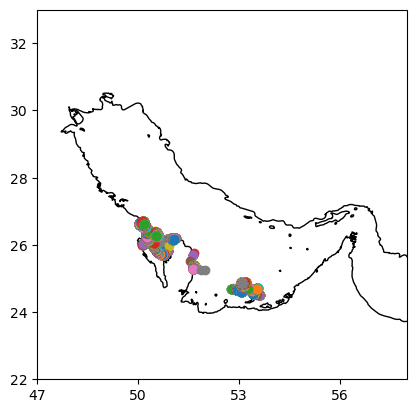

In [75]:
# Define indices_inbox list
indices_inbox = []
ds_obs_1['mask2'] = xr.DataArray(np.zeros(ds_obs_1.dims['time_index']), dims='time_index')
ds_obs_1['lon_bef'] = xr.DataArray(np.zeros(ds_obs_1.dims['time_index']), dims='time_index')
ds_obs_1['lat_bef'] = xr.DataArray(np.zeros(ds_obs_1.dims['time_index']), dims='time_index')
ds_obs_1['lon_end'] = xr.DataArray(np.zeros(ds_obs_1.dims['time_index']), dims='time_index')
ds_obs_1['lat_end'] = xr.DataArray(np.zeros(ds_obs_1.dims['time_index']), dims='time_index')
imask = 0

# pd_dive_2 = pd.DataFrame(columns=['ik', 'temp0', 'temp1', 'rec_len','first_record','last_record'])
ds_dive_2 = xr.Dataset(
    {
        'temp1': ('dive_index', np.array([])),
        'temp0': ('dive_index', np.array([])),
        'rec_len': ('dive_index', np.array([])),
        'first_record': ('dive_index', np.array([])),
        'last_record': ('dive_index', np.array([]))
    },
    coords={'dive_index': np.array([])}
)

ax = plt.axes(projection=ccrs.PlateCarree())
# first find the indices whose GPS location is in the box
for idx in indices:
    p1 = ds_obs_1.isel(time_index=idx[0])
    p2 = ds_obs_1.isel(time_index=idx[1])

    # if (p1.lon>x_geobox[0])&(p1.lon<x_geobox[1])&(p1.lat>y_geobox[0])&(p1.lat<y_geobox[1]):
    #     if (p2.lon>x_geobox[0])&(p2.lon<x_geobox[1])&(p2.lat>y_geobox[0])&(p2.lat<y_geobox[1]):
            # print(idx)
            # indices_inbox.append(idx)
            # print(p1.lon.values, p1.lat.values)
            # print(p2.lon.values, p2.lat.values)
            # plt.plot([p1.lon.values,p2.lon.values], [p1.lat.values,p2.lat.values],'o')
            # Check if records between idx[0] and idx[1] have the datatype SEN_ALL_1Hz_START and SEN_ALL_1Hz_END
    if 'SEND_ALL2_1Hz' in ds_obs_1.datatype.isel(time_index=slice(idx[0], idx[1])).values:
        # Find pairs of 'SEND_ALL2_1Hz_START' and 'SEND_ALL2_1Hz_END' in ds_obs_1.datatype.isel(time_index=slice(idx[0], idx[1]))
        start_indices = ds_obs_1.time_index.where(ds_obs_1.datatype.isel(time_index=slice(idx[0], idx[1])) == 'SEND_ALL2_1Hz_START', drop=True).values.astype(int)
        end_indices = ds_obs_1.time_index.where(ds_obs_1.datatype.isel(time_index=slice(idx[0], idx[1])) == 'SEND_ALL2_1Hz_END', drop=True).values.astype(int)
        
        # Ensure that each start has a corresponding end
        for start, end in zip(start_indices, end_indices):
            if start < end:
                ds_obs_1['mask2'].loc[dict(time_index=slice(start, end))] = imask
                ds_obs_1['lon_bef'].loc[dict(time_index=slice(start, end))] = p1.lon.values
                ds_obs_1['lat_bef'].loc[dict(time_index=slice(start, end))] = p1.lat.values
                ds_obs_1['lon_end'].loc[dict(time_index=slice(start, end))] = p2.lon.values
                ds_obs_1['lat_end'].loc[dict(time_index=slice(start, end))] = p2.lat.values
                # pd_dive_2 = pd.concat([pd_dive_2, pd.DataFrame({'ik': [imask], 
                #                                                 'temp1':[ds_obs_1.temp.isel(time_index=end).values],
                #                                                 'temp0':[ds_obs_1.temp.isel(time_index=start).values],
                #                                                 'rec_len':[(end-start).astype(float)],
                #                                                 'first_record':[start],
                #                                                 'last_record':[end],
                #                                                 })], ignore_index=True)
                new_data = xr.Dataset(
                    {
                        'temp1': ('dive_index', [ds_obs_1.temp.isel(time_index=end).values]),
                        'temp0': ('dive_index', [ds_obs_1.temp.isel(time_index=start).values]),
                        'rec_len': ('dive_index', [(end-start).astype(float)]),
                        'first_record': ('dive_index', [start]),
                        'lon': ('dive_index', [ds_obs_1.lon_end.isel(time_index=end).values]),
                        'lat': ('dive_index', [ds_obs_1.lat_end.isel(time_index=end).values]),
                        'time': ('dive_index', [ds_obs_1.original_time.isel(time_index=end).values]),
                        'last_record': ('dive_index', [end])
                    },
                    coords={'dive_index': [imask]}
                )
        
                # Concatenate with existing dataset
                ds_dive_2 = xr.concat([ds_dive_2, new_data], dim='dive_index')   
                imask += 1
        # ds_obs_1['mask2'].loc[dict(time_index=slice(idx[0], idx[1]))] = xr.where(
        #     ds_obs_1.datatype.isin(['SEND_ALL2_1Hz', 'SEND_ALL2_1Hz_START', 'SEND_ALL2_1Hz_END','SEND_ALL2_1Hz_START_END']).loc[dict(time_index=slice(idx[0], idx[1]))],
        #     imask,
        #     ds_obs_1['mask2'].loc[dict(time_index=slice(idx[0], idx[1]))]
        # )
        # imask += 1

        # print(p1.lon.values, p1.lat.values)
        # print(p2.lon.values, p2.lat.values)
        plt.plot([p1.lon.values,p2.lon.values], [p1.lat.values,p2.lat.values],'o')
ax.coastlines()
ax.set_xlim(47,58)
ax.set_ylim(22,33)
ax.set_xticks(np.arange(47,58,3), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(22,33,2), crs=ccrs.PlateCarree())
# ax.legend(loc = "upper left")

# for idx in indices:
#     # print(dfs.loc[idx[0]:idx[1]])
#     dfs_chunk = dfs.loc[idx[0]:idx[1]]
#     sen_start = dfs_chunk[(dfs_chunk['datatype'] == 'SEN_ALL_1Hz_START')]
#     sen_end = dfs_chunk[(dfs_chunk['datatype'] == 'SEN_ALL_1Hz_END')]
#     print(sen_start,sen_end)

#     if not sen_start.empty and not sen_end.empty:
#         chunk_acc = dfs_chunk.loc[sen_start.index[0]:sen_end.index[0]]
#         if 'chunk_acc' in locals():
#             chunk_acc = pd.concat([chunk_acc, dfs_chunk.loc[sen_start.index[0]:sen_end.index[0]]])
#         else:
#             chunk_acc = dfs_chunk.loc[sen_start.index[0]:sen_end.index[0]]

1000000000 nanoseconds
35.0
1000000000 nanoseconds
43.0
1000000000 nanoseconds
47.0
1010000000 nanoseconds
52.0
1010000000 nanoseconds
55.0
1000000000 nanoseconds
50.0
1000000000 nanoseconds
41.0
1000000000 nanoseconds
33.0
1000000000 nanoseconds
42.0
1000000000 nanoseconds
53.0
1000000000 nanoseconds
36.0
1010000000 nanoseconds
35.0
1000000000 nanoseconds
34.0
1000000000 nanoseconds
40.0
1000000000 nanoseconds
46.0
1000000000 nanoseconds
30.0
1000000000 nanoseconds
28.0
1000000000 nanoseconds
24.0


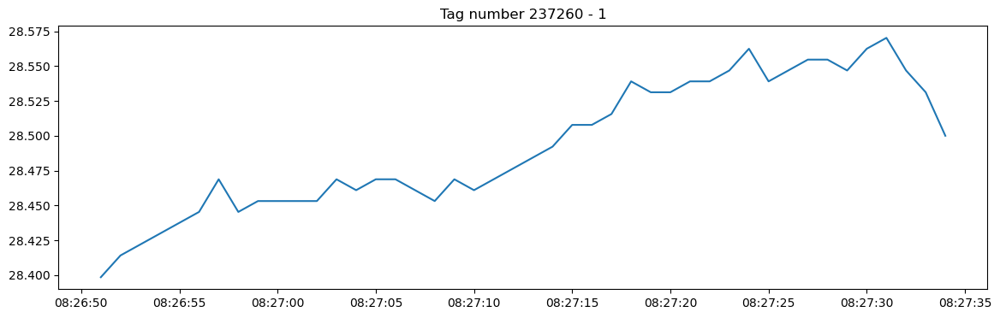

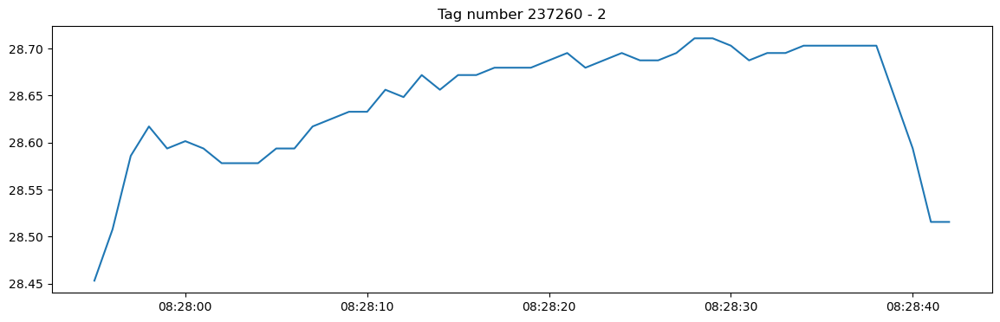

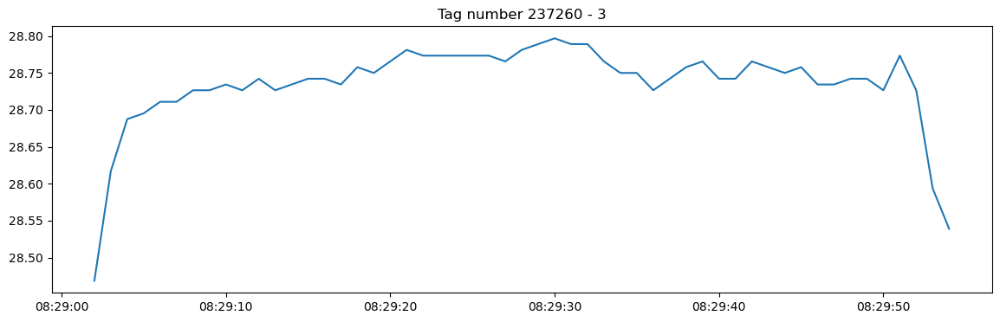

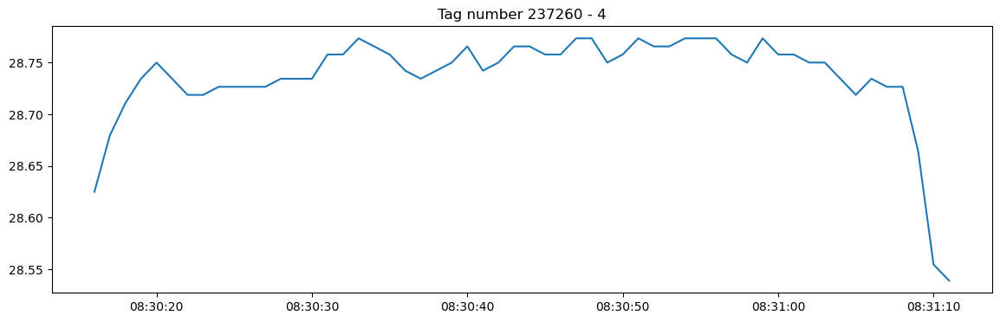

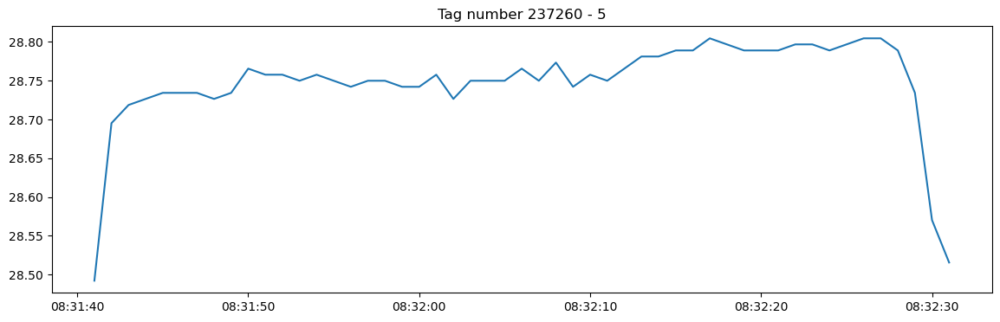

...

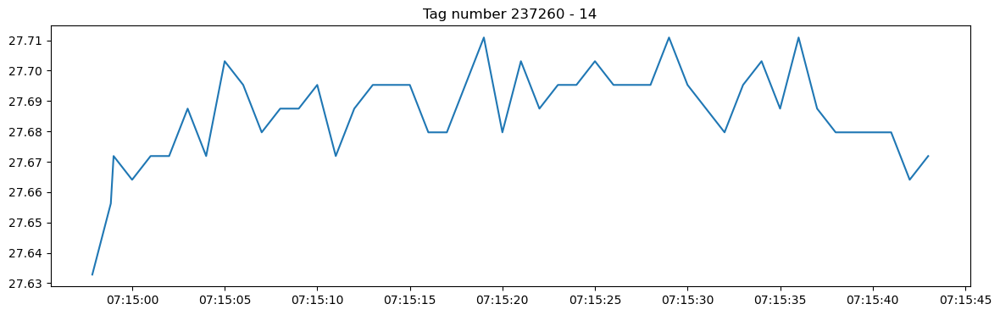

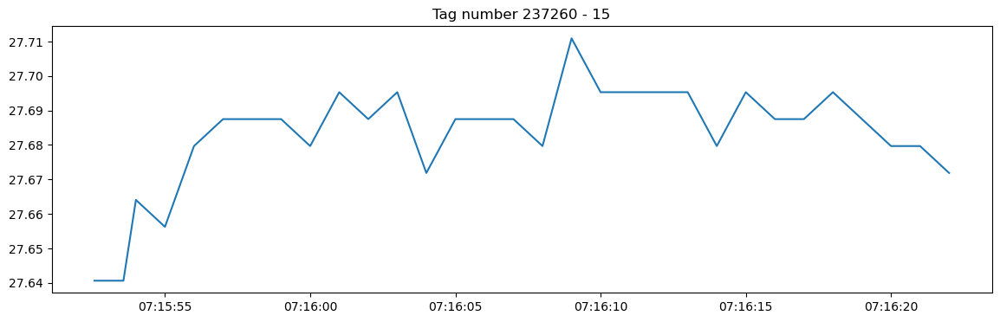

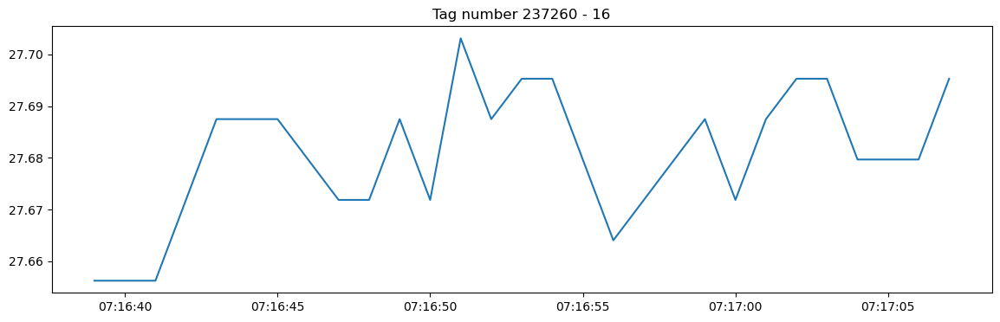

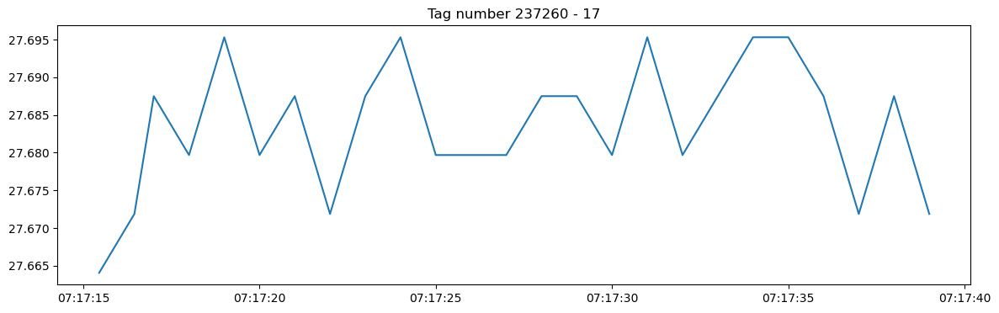

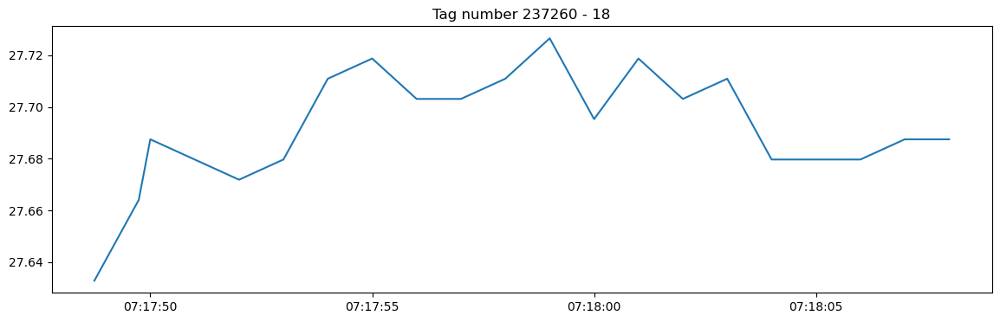

In [76]:
for ik in range(18):
    plt.figure(figsize=(14,4))
    plt.plot(ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).original_time,ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).temp)
    # plt.plot(ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).original_time,ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).depth)
    plt.title(f'Tag number {idn} - {ik+1}')
    print(np.max(np.diff(ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).time)))
    print(ds_dive_2.isel(dive_index=ik).rec_len.values)

[2.39 3.55 4.61 5.73 6.42 7.2  7.82 8.17 8.41 8.47 8.5  8.44 8.44 8.44
 8.44 8.47 8.44 8.35 8.2  8.2  8.23 8.29 8.47 8.44 8.38 8.41 8.41 8.47
 8.47 8.5  8.44 8.23 8.38 8.17 7.32 5.92 4.39 2.8  1.18 0.  ] 8.5
26.0
40
[2.42 3.67 5.05 6.11 6.88 7.6  8.13 8.2  8.47 8.35 8.17 8.47 8.53 8.5
 8.53 8.5  8.47 8.5  8.53 8.53 8.6  8.5  8.5  8.5  8.47 8.5  8.47 8.41
 8.5  8.5  8.53 8.53 8.53 8.41 8.29 8.41 8.35 8.29 8.29 8.38 8.5  8.47
 8.44 8.47 8.44 8.38 8.26 7.82 7.1  6.11 4.73 3.33 1.92 0.33] 8.6
40.0
54
[3.27 4.36 5.42 6.29 7.26 8.04 8.5  8.57 8.73 8.67 8.57 8.67 8.7  8.73
 8.73 8.7  8.7  8.7  8.7  8.7  8.63 8.67 8.67 8.7  8.73 8.67 8.7  8.76
 8.67 8.67 8.67 8.67 8.63 8.63 8.63 8.63 8.63 8.63 8.63 8.67 8.67 8.56
 8.63 8.6  8.53 8.56 8.6  8.5  8.6  8.5  8.44 8.35 7.79 6.98 5.98 4.92
 3.67 2.21 0.65] 8.76
45.0
59
[3.27 4.51 5.54 6.35 7.01 7.64 8.13 8.41 8.47 8.44 8.38 8.38 8.41 8.38
 8.44 8.38 8.35 8.35 8.35 8.32 8.35 8.41 8.29 8.35 8.41 8.35 8.41 8.38
 8.38 8.35 8.32 8.35 8.41 8.38 8.38 8.38 8

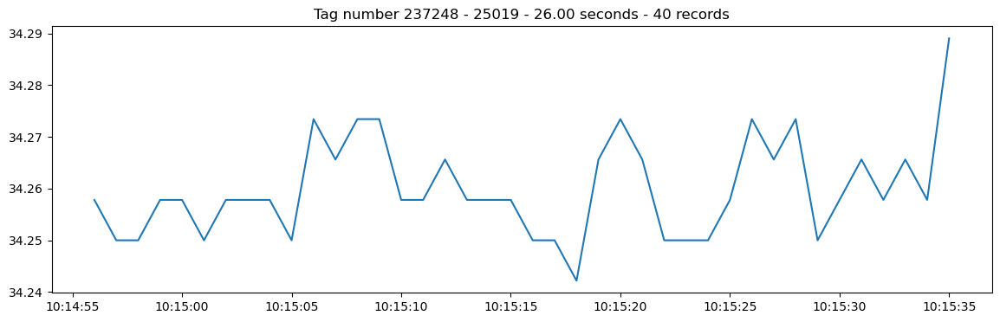

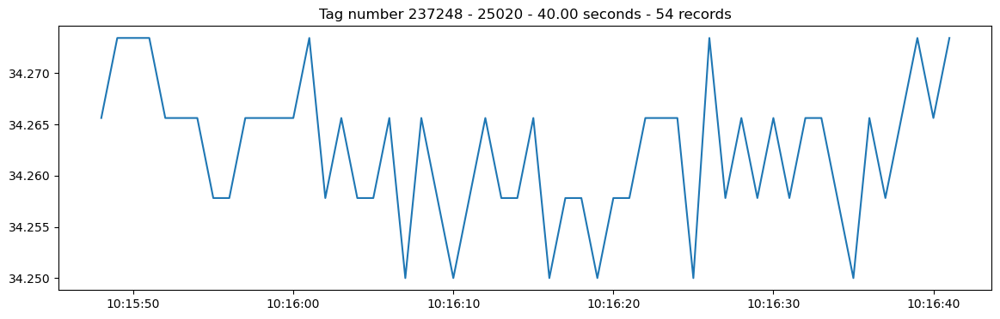

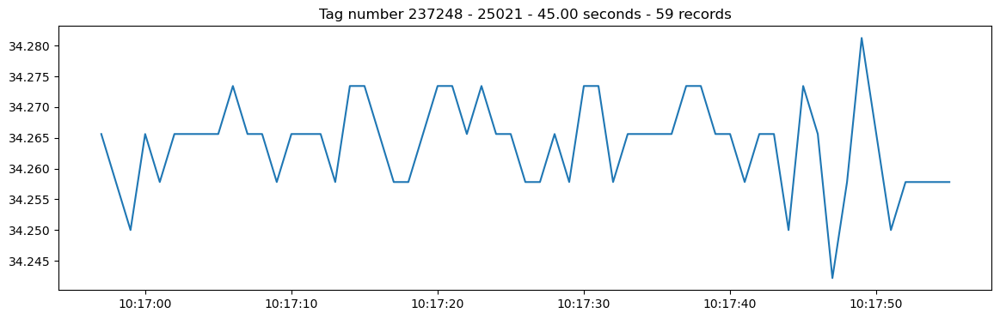

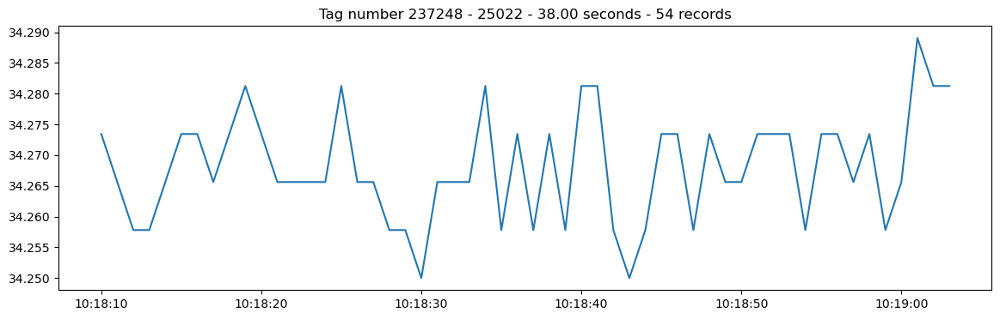

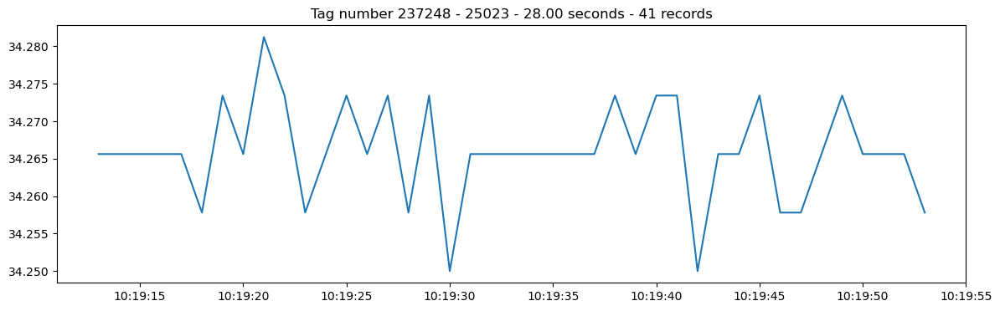

...

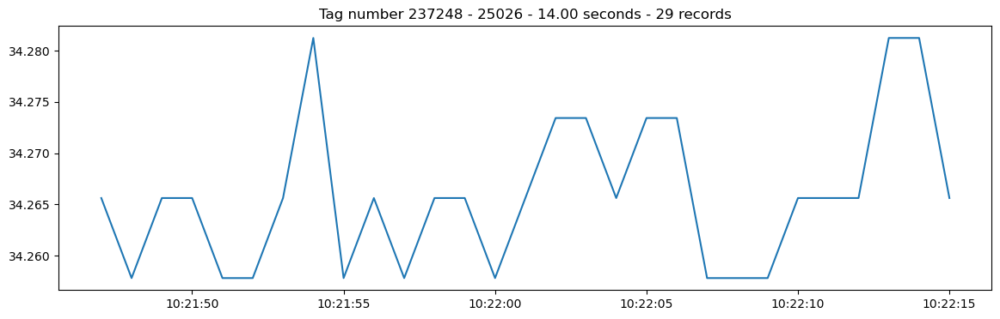

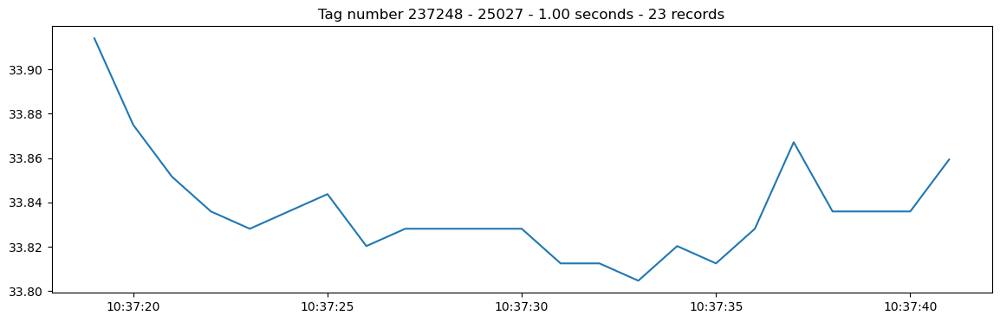

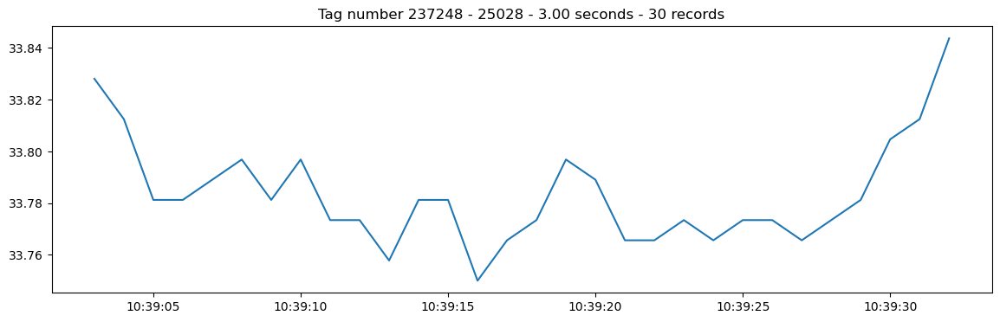

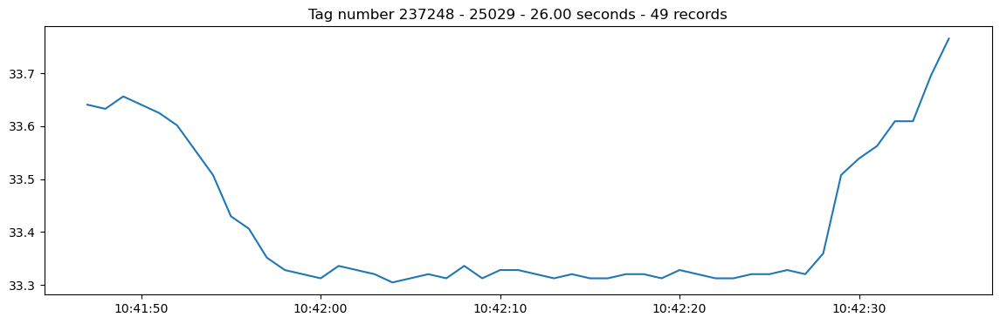

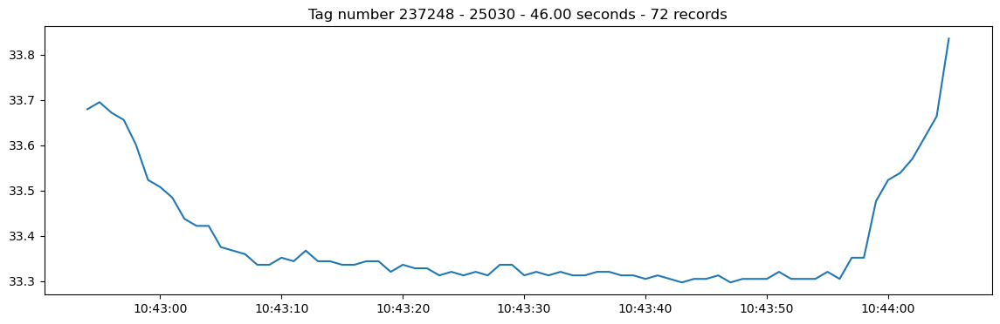

In [49]:
# Initialize the new variables in ds_obs_1
ds_obs_1['first_record'] = xr.DataArray(np.full(ds_obs_1.dims['time_index'], np.nan), dims='time_index')
ds_obs_1['last_record'] = xr.DataArray(np.full(ds_obs_1.dims['time_index'], np.nan), dims='time_index')
ds_obs_1['dtb'] = xr.DataArray(np.full(ds_obs_1.dims['time_index'], np.nan), dims='time_index')

for ik in range(25018,25030):
    plt.figure(figsize=(14,4))
    # plt.plot(ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).original_time,ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).temp)
    profile0 = ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True)
    dd = profile0.depth
    dnmax = np.max(dd)
    print(dd.values,dnmax.values)
    nn = len(dd[dd - dnmax <= 0.5])
    first_record = dd[abs(dd - dnmax)<=0.5].time_index.values[0]
    last_record = dd[abs(dd - dnmax) <= 0.5].time_index.values[-1]
    dtb = profile0.original_time.sel(time_index=last_record) - profile0.original_time.sel(time_index=first_record)
    dtb_seconds = dtb.values/np.timedelta64(1, 's')
    print(dtb_seconds)
    print(nn)
    plt.plot(ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).original_time,ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).temp)
    plt.title(f'Tag number {idn} - {ik+1} - {dtb_seconds:.2f} seconds - {nn} records')
    ds_obs_1['first_record'] = xr.where(ds_obs_1.mask2 == ik+1, first_record, ds_obs_1.first_record)
    ds_obs_1['last_record'] = xr.where(ds_obs_1.mask2 == ik+1, last_record, ds_obs_1.last_record)
    ds_obs_1['dtb'] = xr.where(ds_obs_1.mask2 == ik+1, dtb_seconds, ds_obs_1.dtb)

In [77]:
np.unique(ds_obs_1.mask2)

array([0.0000e+00, 1.0000e+00, 2.0000e+00, ..., 1.0266e+04, 1.0267e+04,
       1.0268e+04])

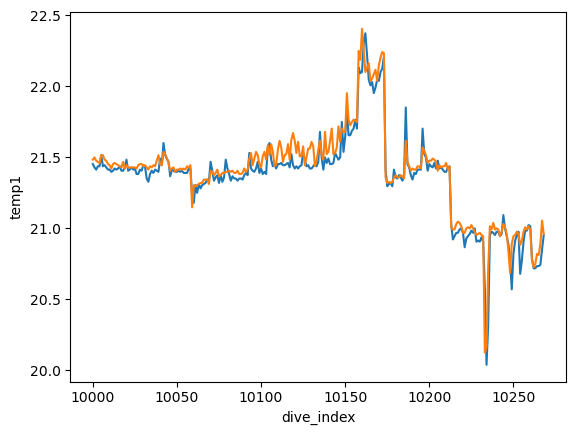

In [78]:
ds_dive_2.temp0.isel(dive_index=slice(10000,12000)).plot()
ds_dive_2.temp1.isel(dive_index=slice(10000,12000)).plot()

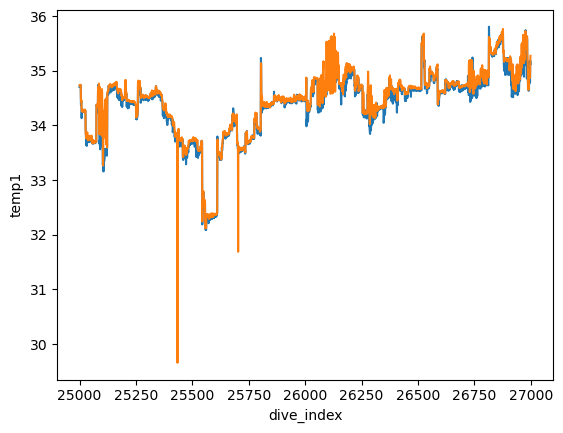

In [149]:
ds_dive_2.temp0.isel(dive_index=slice(25000,27000)).plot()
ds_dive_2.temp1.isel(dive_index=slice(25000,27000)).plot()

# 1. Find the bottom dives / max depth / duration of dives

In [77]:
# Initialize the new variables in ds_obs_1
# ds_obs_1['first_record'] = xr.DataArray(np.full(ds_obs_1.dims['time_index'], np.nan), dims='time_index')
# ds_obs_1['last_record'] = xr.DataArray(np.full(ds_obs_1.dims['time_index'], np.nan), dims='time_index')
# ds_obs_1['dtb'] = xr.DataArray(np.full(ds_obs_1.dims['time_index'], np.nan), dims='time_index')

# Create an empty pandas DataFrame to store the results
pd_dive = pd.DataFrame(columns=['ik', 'first_record', 'last_record', 'dtb', 'dmax','T_surf','T_bot'])
for ik in np.unique(ds_obs_1.mask2)[1:]:  ### omit 0_start from 1 ___
# for ik in range(30):
    if ik % 100 == 0:
        print(f'Processing mask2 value: {ik}')
    # plt.figure(figsize=(14,4))
    # plt.plot(ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).original_time,ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).temp)
    profile0 = ds_obs_1.where(ds_obs_1.mask2==ik,drop=True)
    dd = profile0.depth
    dnmax = np.max(dd).values
    # print(dd.values,dnmax.values)
    nn = len(dd[dd - dnmax <= 0.5])
    first_record = dd[abs(dd - dnmax)<=0.5].time_index.values[0]
    last_record = dd[abs(dd - dnmax) <= 0.5].time_index.values[-1]
    # dtb = (profile0.original_time.sel(time_index=last_record) - profile0.original_time.sel(time_index=first_record)).values/np.timedelta64(1, 's')
    temp_surf = profile0.temp.isel(time_index=-1).values
    temp_surf0 = profile0.temp.isel(time_index=0).values
    # temp_bot = profile0.temp.sel(time_index=last_record).values
    # print(dtb_seconds)
    # print(nn)
    # plt.plot(ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).original_time,ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).depth)
    # plt.title(f'Tag number {idn} - {ik+1} - {dtb_seconds:.2f} seconds - {nn} records')
    # ds_obs_1['first_record'] = xr.where(ds_obs_1.mask2 == ik+1, first_record, ds_obs_1.first_record)
    # ds_obs_1['last_record'] = xr.where(ds_obs_1.mask2 == ik+1, last_record, ds_obs_1.last_record)
    # ds_obs_1['dtb'] = xr.where(ds_obs_1.mask2 == ik+1, dtb, ds_obs_1.dtb)

    # Store ik, first_record, last_record, dtb to a pandas DataFrame
    # if 'pd_dive' not in globals():
    #     pd_dive = pd.DataFrame(columns=['ik', 'first_record', 'last_record', 'dtb'])

    # pd_dive = pd.concat([pd_dive, pd.DataFrame({'ik': [ik], 'first_record': [first_record], 'last_record': [last_record], 'dtb': [dtb], 'dmax': [dnmax],'T_surf':[temp_surf],'T_bot':[temp_bot]})], ignore_index=True)
    pd_dive = pd.concat([pd_dive, pd.DataFrame({'ik': [ik], 'first_record': [first_record], 'last_record': [last_record], 'dmax': [dnmax],'T_surf':[temp_surf],'T_surf0':[temp_surf0]})], ignore_index=True)

Processing mask2 value: 100.0
Processing mask2 value: 200.0
Processing mask2 value: 300.0
Processing mask2 value: 400.0
Processing mask2 value: 500.0
Processing mask2 value: 600.0
Processing mask2 value: 700.0
Processing mask2 value: 800.0
Processing mask2 value: 900.0
Processing mask2 value: 1000.0
Processing mask2 value: 1100.0
Processing mask2 value: 1200.0
Processing mask2 value: 1300.0
Processing mask2 value: 1400.0
Processing mask2 value: 1500.0
Processing mask2 value: 1600.0
Processing mask2 value: 1700.0
Processing mask2 value: 1800.0
Processing mask2 value: 1900.0
Processing mask2 value: 2000.0
Processing mask2 value: 2100.0
Processing mask2 value: 2200.0
Processing mask2 value: 2300.0
Processing mask2 value: 2400.0
Processing mask2 value: 2500.0
Processing mask2 value: 2600.0
Processing mask2 value: 2700.0
Processing mask2 value: 2800.0
Processing mask2 value: 2900.0
Processing mask2 value: 3000.0
Processing mask2 value: 3100.0
Processing mask2 value: 3200.0
Processing mask2 

In [78]:
pd_dive['lon'] = ds_obs_1.lon_end.isel(time_index=pd_dive['last_record'].values.astype(int)).values
pd_dive['lat'] = ds_obs_1.lat_end.isel(time_index=pd_dive['last_record'].values.astype(int)).values
pd_dive['time'] = ds_obs_1.original_time.isel(time_index=pd_dive['last_record'].values.astype(int)).values
pd_dive['T_bot'] = ds_obs_1.temp.isel(time_index=pd_dive['last_record'].values.astype(int)).values

pd_dive['rec_len'] = pd_dive['last_record']-pd_dive['first_record']
pd_dive

,ik,first_record,last_record,dtb,dmax,T_surf,T_bot,T_surf0,lon,lat,time,rec_len
0,1.0,64,68,NaN,2.91,28.2109375,28.101562,28.2578125,50.780949,25.729845,2023-11-04 06:51:35,4
1,2.0,74,93,NaN,3.04,28.0390625,28.039062,28.140625,50.780949,25.729845,2023-11-04 06:52:05,19
2,3.0,99,128,NaN,2.98,28.0390625,28.015625,28.0390625,50.780411,25.730028,2023-11-04 06:52:49,29
3,4.0,134,149,NaN,1.46,28.3828125,28.406250,28.359375,50.781914,25.724712,2023-11-04 06:54:27,15
4,5.0,153,181,NaN,1.32,28.3671875,28.367188,28.34375,50.781803,25.724785,2023-11-04 06:55:54,28
...,...,...,...,...,...,...,...,...,...,...,...,...
19602,19603.0,609245,609485,NaN,132.56,30.5546875,30.554688,30.28125,50.417881,25.488762,2024-04-26 14:32:49,240
19603,19604.0,609486,609726,NaN,132.56,30.546875,30.546875,30.59375,50.417881,25.488762,2024-04-26 14:40:51,240
19604,19605.0,609727,609967,NaN,132.56,30.359375,30.359375,30.46875,50.417881,25.488762,2024-04-26 14:48:55,240
19605,19606.0,609968,610208,NaN,132.56,30.03125,30.031250,30.21875,50.417881,25.488762,2024-04-26 14:56:59,240


,ik,first_record,last_record,dtb,dmax,T_surf,T_bot,lon,lat,time
0,1.0,64,68,NaN,2.91,28.2109375,28.101562,50.780949,25.729845,2023-11-04 06:51:35
1,2.0,74,93,NaN,3.04,28.0390625,28.039062,50.780949,25.729845,2023-11-04 06:52:05
2,3.0,99,128,NaN,2.98,28.0390625,28.015625,50.780411,25.730028,2023-11-04 06:52:49
3,4.0,134,149,NaN,1.46,28.3828125,28.406250,50.781914,25.724712,2023-11-04 06:54:27
4,5.0,153,181,NaN,1.32,28.3671875,28.367188,50.781803,25.724785,2023-11-04 06:55:54
...,...,...,...,...,...,...,...,...,...,...
19602,19603.0,609245,609485,NaN,132.56,30.5546875,30.554688,50.417881,25.488762,2024-04-26 14:32:49
19603,19604.0,609486,609726,NaN,132.56,30.546875,30.546875,50.417881,25.488762,2024-04-26 14:40:51
19604,19605.0,609727,609967,NaN,132.56,30.359375,30.359375,50.417881,25.488762,2024-04-26 14:48:55
19605,19606.0,609968,610208,NaN,132.56,30.03125,30.031250,50.417881,25.488762,2024-04-26 14:56:59


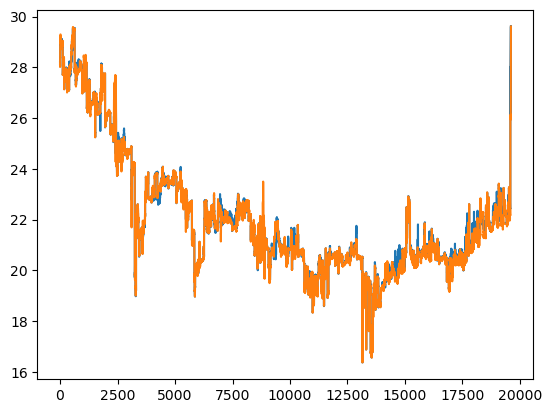

In [55]:
pd_dive[pd_dive['T_surf']<30].T_surf.astype(float).plot()
pd_dive[pd_dive['T_surf']<30].T_bot.astype(float).plot()
pd_dive

<Axes: >

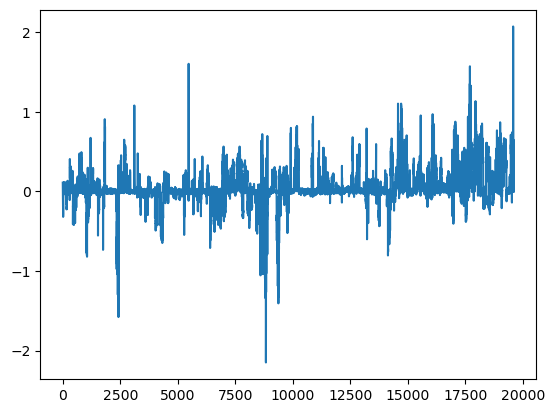

In [104]:
# pd_dive[pd_dive['T_surf']<50].T_surf.astype(float).plot()
(pd_dive[pd_dive['T_surf']<50].T_surf-pd_dive[pd_dive['T_surf']<50].T_bot).astype(float).plot()

In [105]:
pd_dive.to_csv(wrk_dir+'dive_profile_PG_acc_raw_v1_keep_gps_BAHHASO23.csv')

In [106]:
pd_dive = pd.read_csv('dive_profile_PG_acc_raw_v1_keep_gps_BAHHASO23.csv',parse_dates=True,index_col='time')
pd_dive

,Unnamed: 0,ik,first_record,last_record,dtb,dmax,T_surf,T_bot,T_surf0,lon,lat,rec_len
time,,,,,,,,,,,,
2023-11-04 06:51:35,0,1.0,64,68,NaN,2.91,28.210938,28.101562,28.257812,50.780949,25.729845,4
2023-11-04 06:52:05,1,2.0,74,93,NaN,3.04,28.039062,28.039062,28.140625,50.780949,25.729845,19
2023-11-04 06:52:49,2,3.0,99,128,NaN,2.98,28.039062,28.015625,28.039062,50.780411,25.730028,29
2023-11-04 06:54:27,3,4.0,134,149,NaN,1.46,28.382812,28.406250,28.359375,50.781914,25.724712,15
2023-11-04 06:55:54,4,5.0,153,181,NaN,1.32,28.367188,28.367188,28.343750,50.781803,25.724785,28
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-26 14:32:49,19602,19603.0,609245,609485,NaN,132.56,30.554688,30.554688,30.281250,50.417881,25.488762,240
2024-04-26 14:40:51,19603,19604.0,609486,609726,NaN,132.56,30.546875,30.546875,30.593750,50.417881,25.488762,240
2024-04-26 14:48:55,19604,19605.0,609727,609967,NaN,132.56,30.359375,30.359375,30.468750,50.417881,25.488762,240


In [107]:
ds_dive = xr.Dataset.from_dataframe(pd_dive)
ds_dive

<xarray.Dataset>
Dimensions:       (time: 19607)
Coordinates:
  * time          (time) datetime64[ns] 2023-11-04T06:51:35 ... 2024-04-26T15...
Data variables:
    Unnamed: 0    (time) int64 0 1 2 3 4 5 ... 19602 19603 19604 19605 19606
    ik            (time) float64 1.0 2.0 3.0 ... 1.96e+04 1.961e+04 1.961e+04
    first_record  (time) int64 64 74 99 134 153 ... 609486 609727 609968 610209
    last_record   (time) int64 68 93 128 149 181 ... 609726 609967 610208 610449
    dtb           (time) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    dmax          (time) float64 2.91 3.04 2.98 1.46 ... 132.6 132.6 132.6 132.6
    T_surf        (time) float64 28.21 28.04 28.04 28.38 ... 30.36 30.03 29.61
    T_bot         (time) float64 28.1 28.04 28.02 28.41 ... 30.36 30.03 29.61
    T_surf0       (time) float64 28.26 28.14 28.04 28.36 ... 30.47 30.22 29.76
    lon           (time) float64 50.78 50.78 50.78 50.78 ... 50.42 50.42 50.42
    lat           (time) float64 25.73 25.73 25.73 25.72 ... 25.49 25.49 25.49
    rec_len       (time) int64 4 19 29 15 28 22 14 ... 240 240 240 240 240 240

In [15]:
ds_mur_sec1=ds_mur.sst.sel(time=slice(ds_dive_2.time.min(),ds_dive_2.time.max()),lon=slice(47,58),lat=slice(22,33))


In [81]:
# UAE 2020
# ds_obs1_rnan = ds_obs1.where((ds_obs1.x>10)&(ds_obs1.y>10)&(ds_obs1.temp<40)&(ds_obs1.temp>10)&(ds_obs1.temp!=31.2421875),drop=True)

# ds_mur_sec1=ds_mur.sst.sel(time=slice(pd_dive.time.min(),pd_dive.time.max()))

fmm1=ds_mur_sec1.interp(lon=ds_dive.lon,lat=ds_dive.lat,time=ds_dive.time) #original

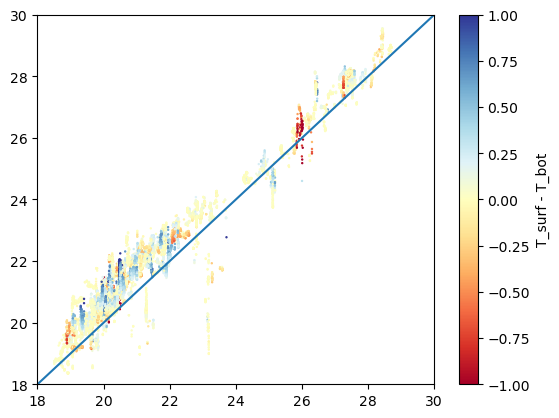

In [82]:
# plot ALL THE DATA (((BEFORE interpolation)))
# ds_obs1_rnan.temp.plot()
# (fmm-273.15).plot()
plt.scatter(fmm1, ds_dive.T_surf, c=ds_dive.T_surf - ds_dive.T_bot, cmap='RdYlBu', s=0.5,vmax=1,vmin=-1)
# plt.scatter(fmm1, ds_dive.T_surf, c=ds_dive.last_record - ds_dive.first_record, cmap='RdBu', s=1)

plt.colorbar(label='T_surf - T_bot')
# plt.colorbar(label='record length (seconds)')



plt.xlim([18, 30]),plt.ylim([18, 30])
plt.plot([18,37],[18,37])

# print(np.sqrt(np.mean(fmm-ds_obs_rnan1.temp)**2).values)
# print(np.sqrt(np.mean(fmm-ds_obs_rnan2.temp)**2).values)
# print(np.sqrt(np.mean(fmm-ds_obs_rnan3.temp)**2).values)
# print(np.sqrt(np.mean(fmm-ds_obs_rnan4.temp)**2).values)

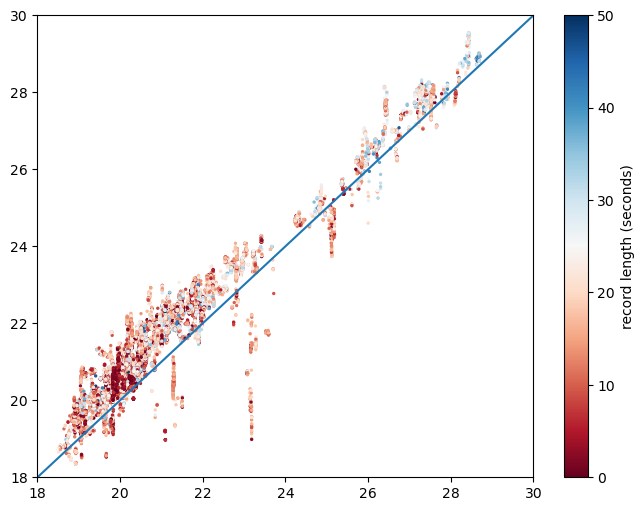

In [76]:
# plot ALL THE DATA (((BEFORE interpolation)))
# ds_obs1_rnan.temp.plot()
# (fmm-273.15).plot()
# plt.scatter(fmm1, ds_dive.T_surf, c=ds_dive.T_surf - ds_dive.T_bot, cmap='RdBu', s=0.5,vmax=1,vmin=-1)
plt.figure(figsize=(8,6))
plt.scatter(fmm1, ds_dive.T_surf, c=ds_dive.last_record - ds_dive.first_record, cmap='RdBu', s=2,vmax=50)
# plt.scatter(fmm1, ds_dive.where(ds_dive.rec_len<30).T_surf, cmap='RdBu', s=2,vmax=50)
# plt.scatter(fmm1, ds_dive.where(ds_dive.rec_len>30).T_surf, cmap='RdBu', s=2,vmax=50)

# plt.colorbar(label='T_surf - T_bot')
plt.colorbar(label='record length (seconds)')

plt.xlim([18, 30]),plt.ylim([18, 30])
plt.plot([18,37],[18,37])

# print(np.sqrt(np.mean(fmm-ds_obs_rnan1.temp)**2).values)
# print(np.sqrt(np.mean(fmm-ds_obs_rnan2.temp)**2).values)
# print(np.sqrt(np.mean(fmm-ds_obs_rnan3.temp)**2).values)
# print(np.sqrt(np.mean(fmm-ds_obs_rnan4.temp)**2).values)

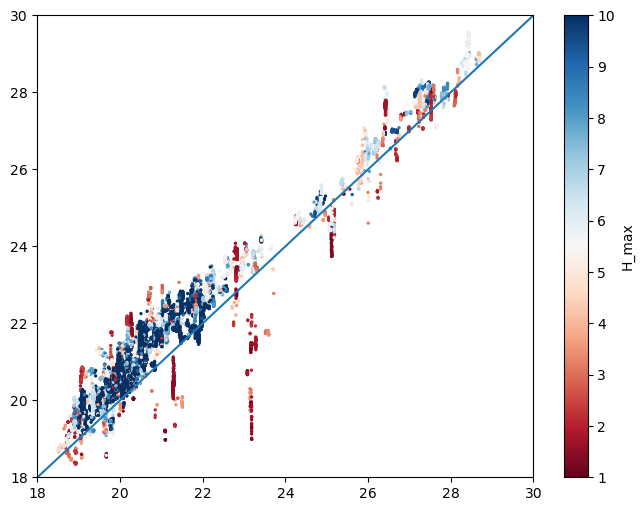

In [74]:
plt.figure(figsize=(8,6))
# plt.scatter(fmm1, ds_dive.T_surf, c=ds_dive.last_record - ds_dive.first_record, cmap='RdBu', s=2,vmax=50)
plt.scatter(fmm1, ds_dive.T_surf, c=ds_dive.dmax, cmap='RdBu', s=2,vmax=10)
# plt.scatter(fmm1, ds_dive.where(ds_dive.rec_len>30).T_surf, cmap='RdBu', s=2,vmax=50)

plt.colorbar(label='H_max (m)')
# plt.colorbar(label='record length (seconds)')

plt.xlim([18, 30]),plt.ylim([18, 30])
plt.plot([18,37],[18,37])

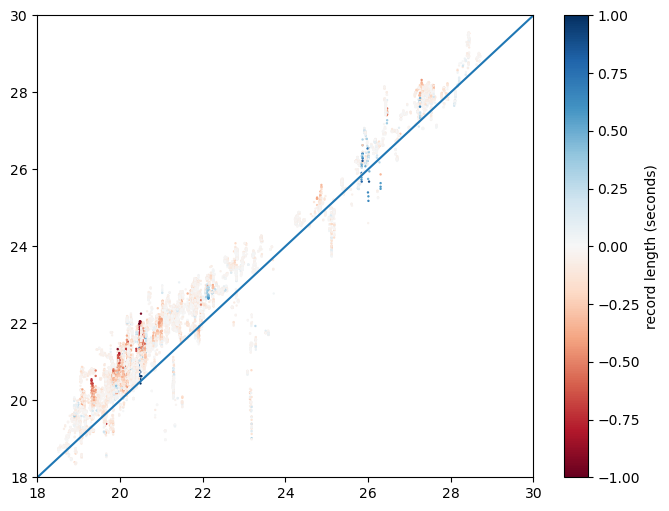

In [ ]:
# plot ALL THE DATA (((BEFORE interpolation)))
# ds_obs1_rnan.temp.plot()
# (fmm-273.15).plot()
plt.figure(figsize=(8,6))
plt.scatter(fmm1, ds_dive.T_surf, c=ds_dive.T_surf0 - ds_dive.T_surf, cmap='RdBu', s=0.5,vmax=1,vmin=-1)
# plt.scatter(fmm1, ds_dive.T_surf, c=(ds_dive.T_surf0 - ds_dive.T_surf)/np.exp(ds_dive.rec_len.astype(float)), cmap='RdBu',vmax=0.001,vmin=-0.001,s=1)
# plt.scatter(fmm1, ds_dive.where(ds_dive.rec_len<30).T_surf, cmap='RdBu', s=2,vmax=50)
# plt.scatter(fmm1, ds_dive.where(ds_dive.rec_len>30).T_surf, cmap='RdBu', s=2,vmax=50)

# plt.colorbar(label='T_surf - T_bot')
plt.colorbar(label='record length (seconds)')

plt.xlim([18, 30]),plt.ylim([18, 30])
plt.plot([18,37],[18,37])

# print(np.sqrt(np.mean(fmm-ds_obs_rnan1.temp)**2).values)
# print(np.sqrt(np.mean(fmm-ds_obs_rnan2.temp)**2).values)
# print(np.sqrt(np.mean(fmm-ds_obs_rnan3.temp)**2).values)
# print(np.sqrt(np.mean(fmm-ds_obs_rnan4.temp)**2).values)

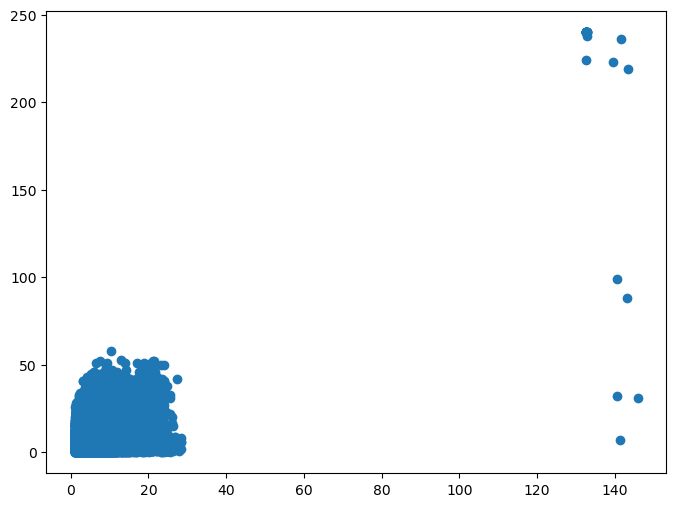

In [96]:

plt.figure(figsize=(8,6))
plt.scatter( ds_dive.dmax,ds_dive.rec_len)

# 2. Find first record and last record for each dive / duration of dives

In [79]:
ds_dive_2

<xarray.Dataset>
Dimensions:       (dive_index: 10269)
Coordinates:
  * dive_index    (dive_index) float64 0.0 1.0 2.0 ... 1.027e+04 1.027e+04
Data variables:
    temp1         (dive_index) float64 28.45 28.5 28.52 ... 20.89 21.05 20.96
    temp0         (dive_index) float64 28.4 28.4 28.45 ... 20.74 20.85 20.95
    rec_len       (dive_index) float64 35.0 43.0 47.0 52.0 ... 22.0 36.0 36.0
    first_record  (dive_index) float64 81.0 119.0 165.0 ... 3.181e+05 3.181e+05
    last_record   (dive_index) float64 116.0 162.0 212.0 ... 3.181e+05 3.181e+05
    lon           (dive_index) float64 50.8 50.8 50.8 50.8 ... 53.09 53.09 53.09
    lat           (dive_index) float64 25.77 25.77 25.77 ... 24.86 24.86 24.85
    time          (dive_index) datetime64[ns] 2023-11-06T08:26:27 ... 2024-03...

In [80]:
fmm2=ds_mur_sec1.interp(lon=ds_dive_2.lon,lat=ds_dive_2.lat,time=ds_dive_2.time) #original

In [81]:
ds_dive_2.where(ds_dive_2.dive_index>25000,drop=True)

<xarray.Dataset>
Dimensions:       (dive_index: 0)
Coordinates:
  * dive_index    (dive_index) float64 
Data variables:
    temp1         (dive_index) float64 
    temp0         (dive_index) float64 
    rec_len       (dive_index) float64 
    first_record  (dive_index) float64 
    last_record   (dive_index) float64 
    lon           (dive_index) float64 
    lat           (dive_index) float64 
    time          (dive_index) datetime64[ns]

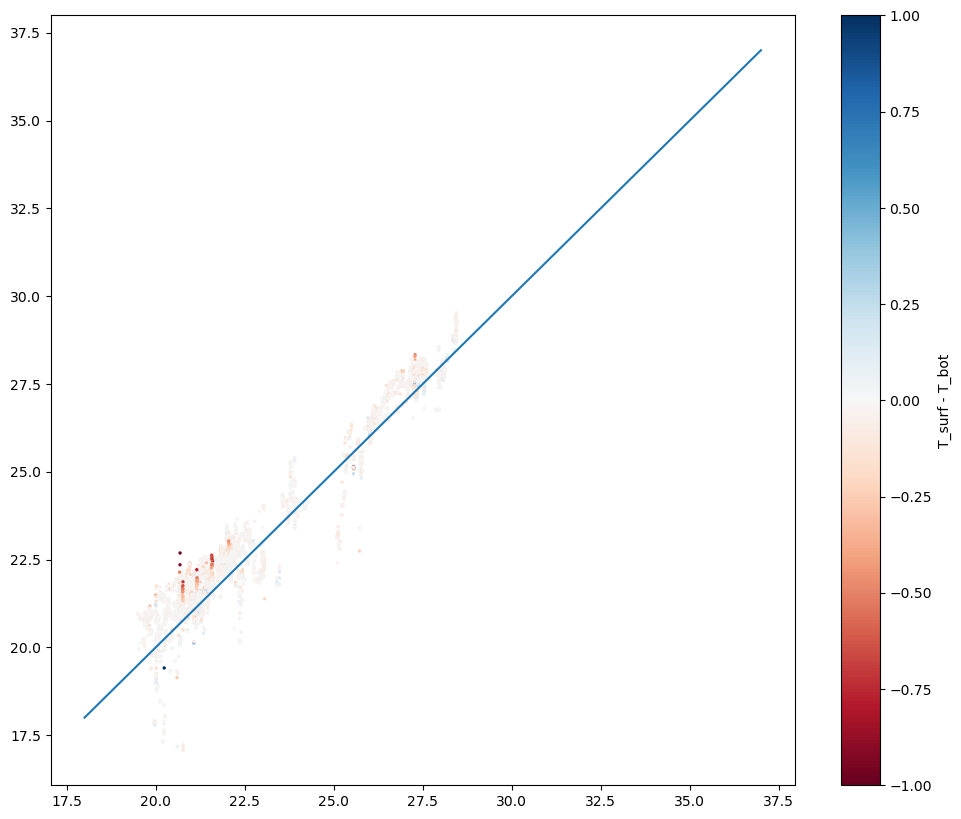

In [82]:
plt.figure(figsize=(12,10))

# plt.scatter(fmm2,ds_dive_2.where(ds_dive_2.dive_index>25000).temp1,c=ds_dive_2.temp0-ds_dive_2.temp1,cmap='RdBu',s=2,vmax=1,vmin=-1)
# plt.scatter(fmm2,ds_dive_2.where(ds_dive_2.dive_index<5000).temp1,c=ds_dive_2.temp0-ds_dive_2.temp1,cmap='RdBu',s=2,vmax=1,vmin=-1)
plt.scatter(fmm2,ds_dive_2.temp1,c=ds_dive_2.temp0-ds_dive_2.temp1,cmap='RdBu',s=2,vmax=1,vmin=-1)
# plt.scatter(fmm2,ds_dive_2.temp0,c='r',cmap='RdBu',s=2,vmax=1,vmin=-1)

# plt.xlim([18, 30]),plt.ylim([18, 30])
plt.plot([18,37],[18,37])
plt.colorbar(label='T_surf - T_bot')

/tmp/ipykernel_587633/3880719972.py:3: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'vmin', 'vmax' will be ignored
  plt.scatter(fmm2,ds_dive_2.temp0,c='b',cmap='RdBu',s=2,vmax=1,vmin=-1)
/tmp/ipykernel_587633/3880719972.py:4: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'vmin', 'vmax' will be ignored
  plt.scatter(fmm2,ds_dive_2.temp1,c='r',cmap='RdBu',s=2,vmax=1,vmin=-1)


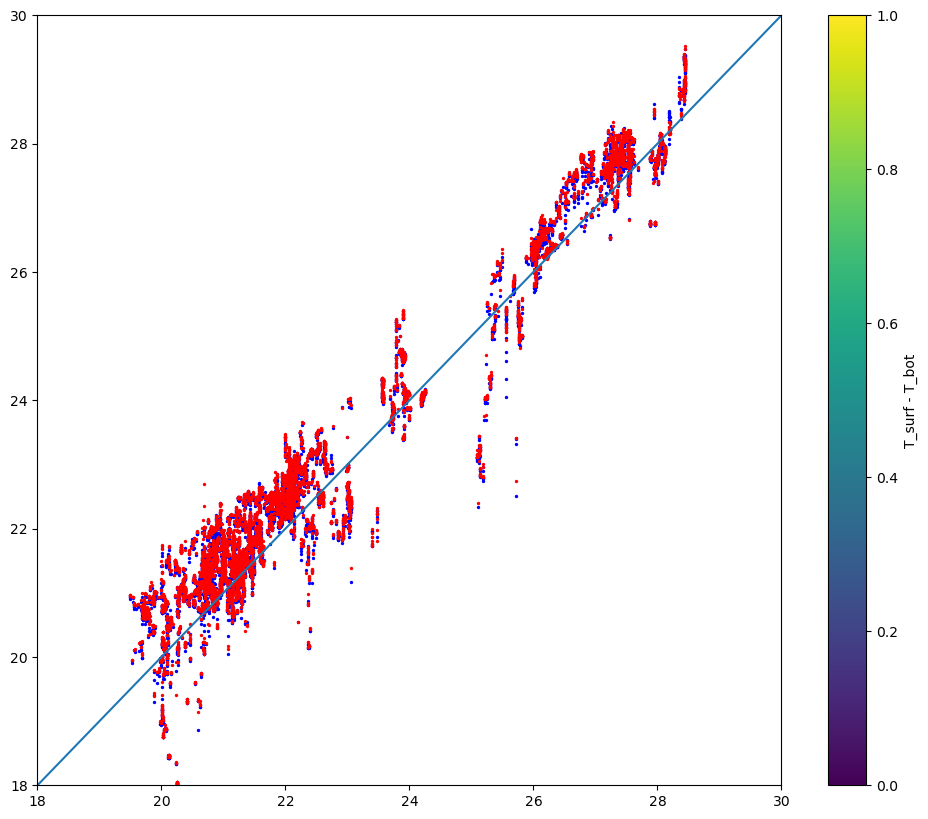

In [84]:
plt.figure(figsize=(12,10))

plt.scatter(fmm2,ds_dive_2.temp0,c='b',cmap='RdBu',s=2,vmax=1,vmin=-1)
plt.scatter(fmm2,ds_dive_2.temp1,c='r',cmap='RdBu',s=2,vmax=1,vmin=-1)


plt.xlim([18, 30]),plt.ylim([18, 30])
plt.plot([18,37],[18,37])
plt.colorbar(label='T_surf - T_bot')

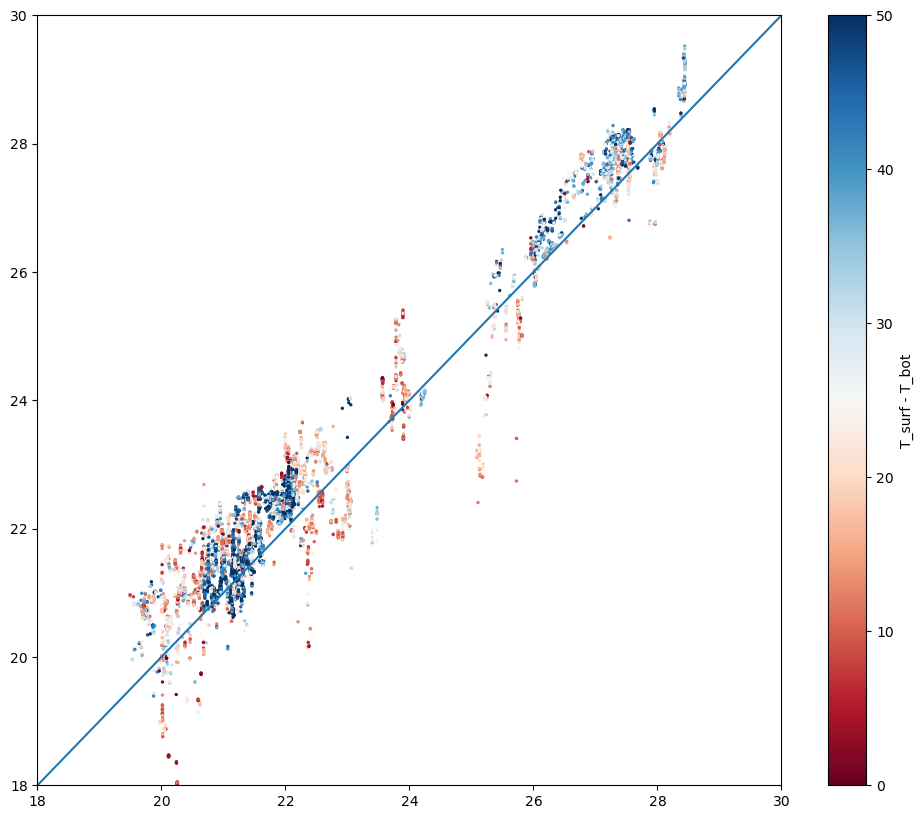

In [85]:
plt.figure(figsize=(12,10))

plt.scatter(fmm2,ds_dive_2.temp1,c=ds_dive_2.rec_len,cmap='RdBu',s=2,vmax=50,vmin=0)

plt.xlim([18, 30]),plt.ylim([18, 30])
plt.plot([18,37],[18,37])
plt.colorbar(label='T_surf - T_bot')

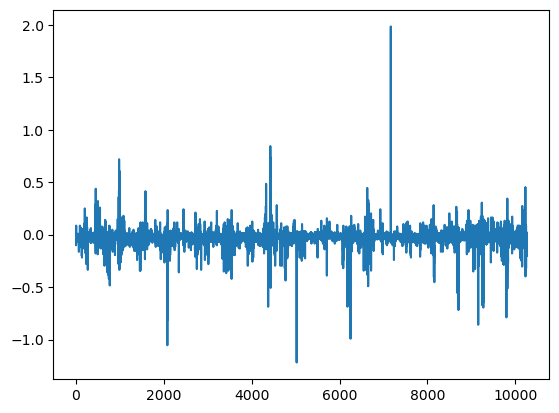

In [86]:
plt.plot(ds_dive_2.temp0-ds_dive_2.temp1)
# plt.plot(ds_dive_2.temp1)

In [38]:
ds_dive_2

<xarray.Dataset>
Dimensions:       (dive_index: 18900)
Coordinates:
  * dive_index    (dive_index) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
Data variables:
    temp1         (dive_index) float64 28.54 28.85 28.84 ... 34.69 34.67 34.69
    temp0         (dive_index) float64 28.51 28.96 28.83 ... 34.57 34.67 34.64
    rec_len       (dive_index) float64 17.0 12.0 6.0 1.0 ... 37.0 34.0 14.0 32.0
    first_record  (dive_index) float64 33.0 97.0 141.0 ... 9.159e+05 9.159e+05
    last_record   (dive_index) float64 50.0 109.0 147.0 ... 9.159e+05 9.159e+05
    lon           (dive_index) float64 50.79 50.82 50.82 ... 50.89 50.89 50.89
    lat           (dive_index) float64 25.73 25.73 25.73 ... 25.96 25.96 25.96
    time          (dive_index) datetime64[ns] 2023-11-04T06:48:43 ... 2024-09...

# all tags